<a href="https://colab.research.google.com/github/RyC37/Emotional-Status-with-Wearable-Data/blob/master/Predict_Positive_or_Negative_Emotion_for_Current_User.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Predict Positive or Negative Emotion (Fitbit Data + Survey Data, Stratified Split)

Author: Sicong Zhao

In [0]:
import pandas as pd
import numpy as np
!pip install catboost
import catboost
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GroupKFold, StratifiedKFold

# Logistic Regression
from sklearn.linear_model import LogisticRegression
from sklearn import preprocessing
# Random Forest
from sklearn.ensemble import RandomForestClassifier

# Evaluation
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, f1_score, auc, roc_curve, precision_recall_curve
import seaborn as sns

# Re-sample
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

     |████████████████████████████████| 64.0MB 80kB/s 


/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [0]:
pd.set_option('display.max_rows', 1000)

## 1.Load Data

In [0]:
exp = pd.read_csv('exp_steps_hr_sleep_survey.csv')

In [0]:
exp.reset_index(inplace=True) # Avoid error in cross validation

## 2.EDA

### (1) Missing Data Detection

In [0]:
missing_rate = exp.isna().sum()/exp.shape[0]
missing_rate

index                      0.000000
Unnamed: 0                 0.000000
subject                    0.000000
la_p                       0.000324
ha_p                       0.000000
ha_n                       0.000000
la_n                       0.000000
la                         0.000000
p                          0.000000
n                          0.000000
ha                         0.000000
start_survey               0.002595
survey_no                  0.000000
experiment                 0.000000
DATE_x                     0.000000
Period_of_day              0.002595
VALENCE                    0.000324
VALENCE_mean               0.000324
start_survey_5m_ahead      0.002595
start_survey_10m_ahead     0.002595
start_survey_30m_ahead     0.002595
start_survey_1h_ahead      0.002595
start_survey_3h_ahead      0.002595
survey_date                0.002595
subject_id_x               0.232241
step_max                   0.232241
step_min                   0.232241
step_median                0

In [0]:
# Columns with more than 50% missing
missing_mt_half_col = missing_rate[missing_rate > .5].index.values
missing_mt_half_col

array(['Date', 'Minutes Asleep', 'Minutes Awake', 'Number of Awakenings',
       'Time in Bed', 'DATE_y', 'ID', 'Experiment', 'Start Time',
       'End Time', 'Minutes REM Sleep', 'Minutes Light Sleep',
       'Minutes Deep Sleep', 'Openness', 'Agreeableness', 'Religion'],
      dtype=object)

In [0]:
# Columns with less than 50% missing
missing_lt_half_col = missing_rate[missing_rate <= .3].index.values
missing_lt_half_col

array(['index', 'Unnamed: 0', 'subject', 'la_p', 'ha_p', 'ha_n', 'la_n',
       'la', 'p', 'n', 'ha', 'start_survey', 'survey_no', 'experiment',
       'DATE_x', 'Period_of_day', 'VALENCE', 'VALENCE_mean',
       'start_survey_5m_ahead', 'start_survey_10m_ahead',
       'start_survey_30m_ahead', 'start_survey_1h_ahead',
       'start_survey_3h_ahead', 'survey_date', 'subject_id_x', 'step_max',
       'step_min', 'step_median', 'steps_max_3h', 'steps_min_3h',
       'steps_mean_3h', 'steps_var_3h', 'steps_median_3h', 'move_rate_3h',
       'active_rate_3h', 'very_active_rate_3h', 'running_rate_3h',
       'steps_max_1h', 'steps_min_1h', 'steps_mean_1h', 'steps_var_1h',
       'steps_median_1h', 'move_rate_1h', 'active_rate_1h',
       'very_active_rate_1h', 'running_rate_1h', 'steps_max_30m',
       'steps_min_30m', 'steps_mean_30m', 'steps_var_30m',
       'steps_median_30m', 'move_rate_30m', 'active_rate_30m',
       'very_active_rate_30m', 'running_rate_30m', 'steps_max_10m',
       

In [0]:
# Missingness of label
exp[['la_p', 'ha_p', 'ha_n', 'la_n','la', 'p', 'n', 'ha']].isna().sum()

la_p    1
ha_p    0
ha_n    0
la_n    0
la      0
p       0
n       0
ha      0
dtype: int64

### (2) Observe Labels

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7faa0ed2d2e8>,
      dtype=object)

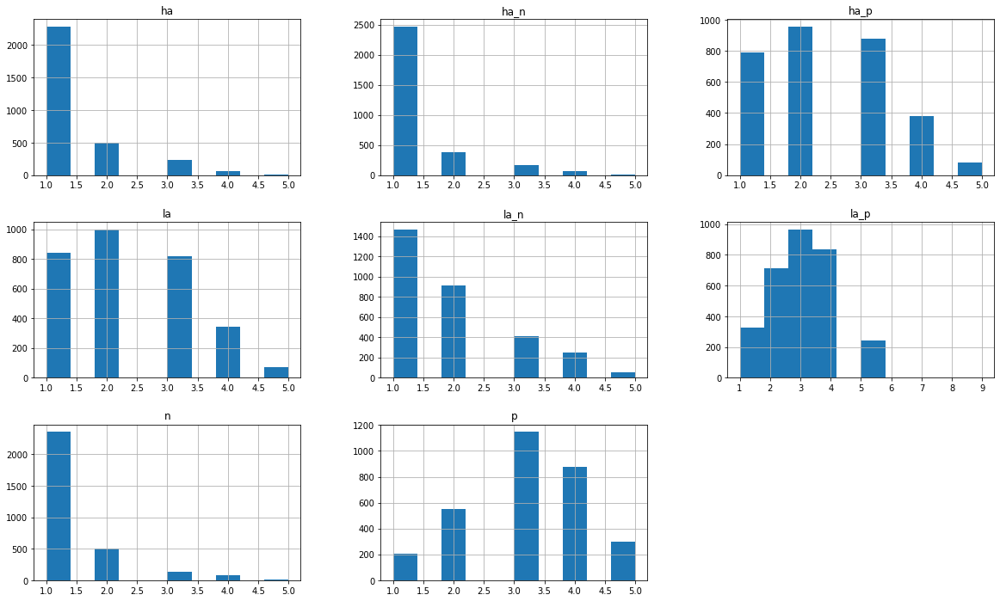

In [0]:
exp[['la_p', 'ha_p', 'ha_n', 'la_n','la', 'p', 'n', 'ha']].hist(figsize=(20,12))

In [0]:
exp[['la_p', 'ha_p', 'ha_n', 'la_n','la', 'p', 'n', 'ha']].describe()

,la_p,ha_p,ha_n,la_n,la,p,n,ha
count,3082.000000,3083.000000,3083.000000,3083.000000,3083.000000,3083.000000,3083.000000,3083.000000
mean,2.985075,2.356471,1.303925,1.866364,2.287707,3.163801,1.343172,1.390204
std,1.118914,1.071917,0.690207,1.030511,1.057988,1.044792,0.719372,0.751720
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,2.000000,1.000000,1.000000,1.000000,1.000000,3.000000,1.000000,1.000000
50%,3.000000,2.000000,1.000000,2.000000,2.000000,3.000000,1.000000,1.000000
75%,4.000000,3.000000,1.000000,2.000000,3.000000,4.000000,1.000000,2.000000
max,9.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


### (3) Observe Positive / Negative Emotion

In [0]:
# 'pn_raw' represent how happy / unhappy the subjects are
exp['pn_raw'] = (exp['la_p'] + exp['p'] + exp['ha_p'])/3 - (exp['la_n'] + exp['n'] + exp['ha_n'])/3

In [0]:
# Ratio of 'pn_raw' < 0
print('pn_raw < 0: ',str(sum(exp['pn_raw'] < 0)/exp.shape[0]))
print('pn_raw = 0: ',str(sum(exp['pn_raw'] == 0)/exp.shape[0]))
print('pn_raw > 0: ',str(sum(exp['pn_raw'] > 0)/exp.shape[0]))

pn_raw < 0:  0.10866039571845605
pn_raw = 0:  0.04573467401881284
pn_raw > 0:  0.8452805708725267


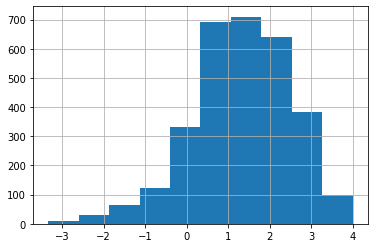

In [0]:
# Histogram of 'pn_raw'
exp['pn_raw'].hist()

## 3.Pre-processing

### (1) Grouping columns for different model
Let's only use predictors with less than 50% missing.

In [0]:
# Update Feature Cols

features_common = ['step_max', 'step_min', 'step_median', 
       
       'steps_max_3h', 'steps_min_3h', 'steps_mean_3h', 'steps_var_3h', 'steps_median_3h', 
       'move_rate_3h', 'active_rate_3h', 'very_active_rate_3h', 'running_rate_3h',
       
       'steps_max_1h', 'steps_min_1h', 'steps_mean_1h', 'steps_var_1h', 'steps_median_1h', 
       'move_rate_1h', 'active_rate_1h', 'very_active_rate_1h', 'running_rate_1h', 
       
       'steps_max_30m', 'steps_min_30m', 'steps_mean_30m', 'steps_var_30m', 'steps_median_30m', 
       'move_rate_30m', 'active_rate_30m', 'very_active_rate_30m', 'running_rate_30m', 
       
       'steps_max_10m', 'steps_min_10m', 'steps_mean_10m', 'steps_var_10m', 'steps_median_10m', 
       'move_rate_10m', 'active_rate_10m', 'very_active_rate_10m', 'running_rate_10m', 
       
       'steps_max_5m', 'steps_min_5m', 'steps_mean_5m', 'steps_var_5m', 'steps_median_5m',
       'move_rate_5m', 'active_rate_5m', 'very_active_rate_5m', 'running_rate_5m', 
       
       'hr_max', 'hr_min', 'hr_med',
       
       'SDNN_3h', 'pHR2_3h', 'rMSSD_3h', 'low_hr_3h', 'high_hr_3h', 'l_h_3h', 'CR_3h', 'hr_mean_3h', 
       'hr_var_3h', 'hr_std_3h', 'hr_median_3h', 'hr_rest_rate_3h', 'hr_moderate_rate_3h',
       'hr_very_active_rate_3h', 
       
       'SDNN_1h', 'pHR2_1h', 'rMSSD_1h', 'low_hr_1h', 'high_hr_1h', 'l_h_1h', 'CR_1h', 'hr_mean_1h',
       'hr_var_1h', 'hr_std_1h', 'hr_median_1h', 'hr_rest_rate_1h',
       'hr_moderate_rate_1h', 'hr_very_active_rate_1h', 
       
       'SDNN_30m', 'pHR2_30m', 'rMSSD_30m', 'low_hr_30m', 'high_hr_30m', 'l_h_30m', 'CR_30m', 'hr_mean_30m', 
       'hr_var_30m', 'hr_std_30m', 'hr_median_30m', 'hr_rest_rate_30m', 
       'hr_moderate_rate_30m', 'hr_very_active_rate_30m', 
       
       'SDNN_10m', 'pHR2_10m', 'rMSSD_10m', 'low_hr_10m', 'high_hr_10m', 'l_h_10m', 'CR_10m', 'hr_mean_10m',
       'hr_var_10m', 'hr_std_10m', 'hr_median_10m', 'hr_rest_rate_10m',
       'hr_moderate_rate_10m', 'hr_very_active_rate_10m', 
       
       'SDNN_5m', 'pHR2_5m', 'rMSSD_5m', 'low_hr_5m', 'high_hr_5m', 'l_h_5m',
       'CR_5m', 'hr_mean_5m', 'hr_var_5m', 'hr_std_5m', 'hr_median_5m',
       'hr_rest_rate_5m', 'hr_moderate_rate_5m', 'hr_very_active_rate_5m',
       
       'hr_0', 'hr_0.3', 'hr_0.5', 'hr_0.8', 'hr_1', 
       
       'SBQ', 'FTP', 'SWLS', 'Neuroticism', 'Extraversion', 'Conscientiousness',
       'NS_total', 'BIS_total', 'BIS.5', 'BAS_D', 'BAS_FS', 'BAS_RR',
       'HAP_actual', 'P_actual', 'LAP_actual', 'LA_actual', 'LAN_actual',
       'N_actual', 'HAN_actual', 'HA_actual', 'HAP_ideal', 'P_ideal',
       'LAP_ideal', 'LA_ideal', 'LAN_ideal', 'N_ideal', 'HAN_ideal',
       'HA_ideal', 'survey_hour'
       
       ]

features_lite = ['step_max', 'step_min', 'step_median', 
       
      #  'steps_max_3h', 'steps_min_3h', 'steps_mean_3h', 'steps_var_3h', 'steps_median_3h', 
      #  'move_rate_3h', 'active_rate_3h', 'very_active_rate_3h', 'running_rate_3h',
       
       'steps_max_1h', 'steps_min_1h', 
       'steps_var_1h', 'steps_median_1h', 
       'active_rate_1h', 
       #'move_rate_1h', 'very_active_rate_1h', 'steps_mean_1h', 'running_rate_1h',  
       
      #  'steps_max_30m', 'steps_min_30m', 'steps_mean_30m', 'steps_var_30m', 'steps_median_30m', 
      #  'move_rate_30m', 'active_rate_30m', 'very_active_rate_30m', 'running_rate_30m', 
       
       'steps_max_10m', 'steps_min_10m', 
       'steps_var_10m', 'steps_median_10m', 
       'move_rate_10m', 
       # 'very_active_rate_10m', 'active_rate_10m', 'steps_mean_10m',
       'running_rate_10m', 
       
      #  'steps_max_5m', 'steps_min_5m', 'steps_mean_5m', 'steps_var_5m', 'steps_median_5m',
      #  'move_rate_5m', 'active_rate_5m', 'very_active_rate_5m', 'running_rate_5m', 
       
       'hr_max', 'hr_min', 'hr_med',
       
       'SDNN_3h', 'pHR2_3h', 'rMSSD_3h', 'low_hr_3h', 'high_hr_3h', 'l_h_3h', 'CR_3h', 
      #  'hr_mean_3h', 
      #  'hr_var_3h', 'hr_std_3h', 'hr_median_3h', 'hr_rest_rate_3h', 'hr_moderate_rate_3h',
      #  'hr_very_active_rate_3h', 
       
       'SDNN_1h', 'pHR2_1h', 'high_hr_1h', 'l_h_1h', 'hr_mean_1h',
       #'rMSSD_1h', 'low_hr_1h', 'CR_1h', 'hr_median_1h', 'hr_var_1h', 
       'hr_std_1h', 'hr_rest_rate_1h',
       'hr_moderate_rate_1h', 'hr_very_active_rate_1h', 
       
       'SDNN_30m', 'pHR2_30m', 'rMSSD_30m', 'low_hr_30m', 'high_hr_30m', 'l_h_30m', 'CR_30m', 
      #  'hr_mean_30m', 
      #  'hr_var_30m', 'hr_std_30m', 'hr_median_30m', 'hr_rest_rate_30m', 
      #  'hr_moderate_rate_30m', 'hr_very_active_rate_30m', 
       
       'SDNN_10m', 'pHR2_10m', 'rMSSD_10m', 'l_h_10m', 
       # 'hr_mean_10m', 'hr_var_10m', 'hr_median_10m', 'low_hr_10m', 'high_hr_10m', 'CR_10m', 
       'hr_std_10m',  'hr_rest_rate_10m',
       'hr_moderate_rate_10m', 'hr_very_active_rate_10m', 
       
       'SDNN_5m', 'pHR2_5m', 'rMSSD_5m', 'low_hr_5m', 'high_hr_5m', 'l_h_5m',
       'CR_5m', 
      #  'hr_mean_5m', 'hr_var_5m', 'hr_std_5m', 'hr_median_5m',
      #  'hr_rest_rate_5m', 'hr_moderate_rate_5m', 'hr_very_active_rate_5m',
       
       'hr_0', 'hr_0.3', 'hr_0.8', 'hr_1', # 'hr_0.5',
       
       'SBQ', 'SWLS', 'Neuroticism', 'Extraversion', 
       'NS_total', 'BIS_total', 'BIS.5', 'BAS_D', 'BAS_FS', 'BAS_RR',
       'Age', 'BMI', 'Children',
      # 'FTP', 'Conscientiousness',
      #  'HAP_actual', 'P_actual', 'LAP_actual', 'LA_actual', 'LAN_actual',
      #  'N_actual', 'HAN_actual', 'HA_actual', 'HAP_ideal', 'P_ideal',
      #  'LAP_ideal', 'LA_ideal', 'LAN_ideal', 'N_ideal', 'HAN_ideal',
      #  'HA_ideal', 
      'survey_hour'
       
       ]


feature_encode = ['exp', 'income', 'have_med', 'is_female',
                'is_married', 'is_divorced', 'is_single', 'is_widowed', 
                'is_with_partner', 'is_wht', 'is_hsp_other', 'is_blk', 
                'is_hsp_caucasian', 'is_birace', 'is_hsp', 'is_asn', 
                'is_white_pacific', 'is_hwi', 'edu_hs', 'edu_ba', 'edu_ma', 
                'edu_phd']
feature_ca = ['edu', 'Ethnicity', 'Sex', 'Marital_Status',
              'have_med', 'experiment']
subject = ['subject']
feature_num = features_common + feature_encode
feature_num_lite = features_lite + feature_encode
feature_cols_ca = features_common + feature_ca
label_cols = ['la_p', 'ha_p', 'ha_n', 'la_n', 'la', 'p', 'n', 'ha']

In [0]:
# Generate design matrix
exp.loc[:,'edu'] = 0
exp.loc[:,'have_med'] = 0

design_matrix = exp[features_common + feature_ca + label_cols + subject]

In [0]:
# Drop NA
# design_matrix = design_matrix.dropna()

In [0]:
design_matrix.shape

(3083, 170)

### (2) Generate Labels

In [0]:
exp['pn_raw'] = (exp['la_p'] + exp['p'] + exp['ha_p'])/3 \
        - (exp['la_n'] + exp['n'] + exp['ha_n'])/3

In [0]:
# Create dummy variable for valence, with 1 to be unhappy, and 0 to be happy.
exp.loc[:,'valence'] = 0
exp.loc[exp['pn_raw'] < 0, 'valence'] = 1

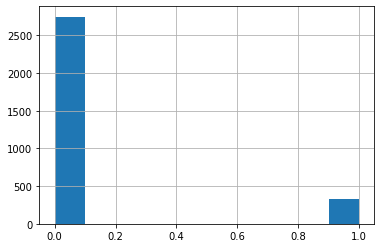

In [0]:
exp['valence'].hist()

As you can see, this is very imbalanced data. Let's use a logistic regression to start.

### (3) Encode Categorical Data

i. List All Categorical Data

In [0]:
# Categorical Features
exp.columns[exp.dtypes == 'object']

Index(['subject', 'start_survey', 'experiment', 'DATE_x', 'Period_of_day',
       'start_survey_5m_ahead', 'start_survey_10m_ahead',
       'start_survey_30m_ahead', 'start_survey_1h_ahead',
       'start_survey_3h_ahead', 'survey_date', 'subject_id_x', 'subject_id_y',
       'Date', 'Experiment', 'Subject', 'Education', 'Ethnicity', 'Sex',
       'Marital_Status', 'Household_income', 'Religion', 'Medications'],
      dtype='object')

ii. Convert Education

In [0]:
exp['Education'].unique()

MBA = ['MBA', 'High School Diploma, BA, MBA', 'B.S. Business Management', 'BS Business','College grad']
Art = ['Bachelor of Arts', 'Bachelor of Arts + Equivalency Degree', 'Bachelor Degree Music Ed']
Med = ['Medical Degree', 'B.A. English/Spanish B.S. Nursing', 'BSN- bachelors of science in nursing']
Psy = ['Education specialist in School Psy, M.A. in Educational Psy', 'M.S. Psychology/ B.A. Sociology', 'B.S. Psychology Texas A&M']


HighSchool = ['12.0','high school', 'High School', 'high school + cosmetology school', 'High School Graduate']
BA = ['Some college', 'B.A. English/Spanish B.S. Nursing', 'B.S. working on MD and MTS', 'B.S.  Mechanical Engineering', 
      "Bachelor's Degree", 'B.A.', 'College student 3 years', 'B.A. from Cornell Univ.', 'Bachelors degree in Social Work', 
      'BS', 'BA Vanderbilt', 'BS Communications', "college graduate (bachelor's degree in Music from Belmont University)",
      'Bachelor of Arts', 'BSN- bachelors of science in nursing', 'BSE Princeton',
      'Obtained B.S., 2011', 'bachelor of science', 'Bachelor of Social Work', 'B.S.', 'BBA - Bachelors', 'BSC Communications',
      'B.A. 1988', 'B.S. degree dietetics, internship', 'Bachelor of Arts + Equivalency Degree', 'Bachelors', 'B.S. Business Management',
      'B.S. Psychology Texas A&M', 'BS Journalism; BS Nutrition', 'B.E.Sc.', 'Bachelor Degree Music Ed', 'NDCDP',
      'BS Math/Computer Science', 'BS Business', 'college graduate','14.0','16.0']
Master = MBA + ['College, Masters',"Bachelor of science, 1 year of Master's",'Masters; PhD ongoing', 'M.S. Psychology/ B.A. Sociology',
                'B.S., MPH','18.0', '19.0']
PhD = ['Ph.D.', 'PhD Candidate', 'PhD', 'BS. (PhD Student currently)', 'Masters; PhD ongoing', 
       'Pursuing PhD at Vanderbilt. Have B.S. from UTK', 'BA from Stanford, JD from Univ of Michigan','21.0', '22.0', '20.0']

In [0]:
# design_matrix['is_MBA'] = 0
# design_matrix.loc[design_matrix['Education'].isin(MBA), 'is_MBA'] = 1
# design_matrix['is_Art'] = 0
# design_matrix.loc[design_matrix['Education'].isin(Art), 'is_Art'] = 1
# design_matrix['is_Med'] = 0
# design_matrix.loc[design_matrix['Education'].isin(Med), 'is_Med'] = 1
# design_matrix['is_Psy'] = 0
# design_matrix.loc[design_matrix['Education'].isin(Psy), 'is_Psy'] = 1

exp.loc[:,'edu'] = 0
exp.loc[:,'edu_hs'] = 0
exp.loc[exp['Education'].isin(HighSchool), 'edu_hs'] = 1
exp.loc[exp['Education'].isin(HighSchool), 'edu'] = 'high school'
exp.loc[:,'edu_ba'] = 0
exp.loc[exp['Education'].isin(BA), 'edu_ba'] = 1
exp.loc[exp['Education'].isin(BA), 'edu'] = 'undergrad'
exp.loc[:,'edu_ma'] = 0
exp.loc[exp['Education'].isin(Master), 'edu_ma'] = 1
exp.loc[exp['Education'].isin(Master), 'edu'] = 'master'
exp.loc[:,'edu_phd'] = 0
exp.loc[exp['Education'].isin(PhD), 'edu_phd'] = 1
exp.loc[exp['Education'].isin(PhD), 'edu'] = 'phd'

iii. Convert Ethnicity

In [0]:
design_matrix['Ethnicity'].unique()

array(['White', 'Hispanic/Other', 'Black', 'Hispanic/Caucasian',
       'Biracial', 'Hispanic', 'Asian', 'White/Pacific Islander', nan,
       'Native Hawaiian/Pacific Islander', 'More than 1 race'],
      dtype=object)

In [0]:
exp.loc[:,'is_wht'] = 0
exp.loc[exp['Ethnicity'] == 'White', 'is_wht'] = 1
exp.loc[:,'is_hsp_other'] = 0
exp.loc[exp['Ethnicity'] == 'Hispanic/Other', 'is_hsp_other'] = 1
exp.loc[:,'is_blk'] = 0
exp.loc[exp['Ethnicity'] == 'Black', 'is_blk'] = 1
exp.loc[:,'is_hsp_caucasian'] = 0
exp.loc[exp['Ethnicity'] == 'Hispanic/Caucasian', 'is_hsp_caucasian'] = 1
exp.loc[:,'is_birace'] = 0
exp.loc[exp['Ethnicity'].isin(['Biracial', 'More than 1 race']), 'is_birace'] = 1
exp.loc[:,'is_hsp'] = 0
exp.loc[exp['Ethnicity'] == 'Hispanic', 'is_hsp'] = 1
exp.loc[:,'is_asn'] = 0
exp.loc[exp['Ethnicity'] == 'Asian', 'is_asn'] = 1
exp.loc[:,'is_white_pacific'] = 0
exp.loc[exp['Ethnicity'] == 'White/Pacific Islander', 'is_white_pacific'] = 1
exp.loc[:,'is_hwi'] = 0
exp.loc[exp['Ethnicity'] == 'Native Hawaiian/Pacific Islander', 'is_hwi'] = 1

iv. Sex

In [0]:
exp['Sex'].unique()
# Drop NA in Sex column
exp = exp[~exp['Sex'].isna()]
exp.shape

(3058, 224)

In [0]:
exp['is_female'] = 0
exp.loc[exp['Sex'] == 'Female', 'is_female'] = 1

v. Marital_Status

In [0]:
exp['Marital_Status'].unique()

array(['Married', 'Divorced', 'Single', 'Engaged', 'Widowed',
       'Living with partner'], dtype=object)

In [0]:
exp.loc[:,'is_married'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Married', 'is_married'] = 1
exp.loc[:,'is_divorced'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Divorced', 'is_divorced'] = 1
exp.loc[:,'is_single'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Single', 'is_single'] = 1
exp.loc[:,'is_widowed'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Widowed', 'is_widowed'] = 1
exp.loc[:,'is_with_partner'] = 0
exp.loc[design_matrix['Marital_Status'] == 'Living with partner', 'is_with_partner'] = 1

vi. Household_income

In [0]:
exp['Household_income'].unique()
# Drop NA in Household_income column
exp = exp[~exp['Household_income'].isna()]
exp.shape

(3029, 230)

In [0]:
exp.loc[:,'income'] = 0
exp.loc[exp['Household_income'] == '$10,000-$19,999', 'income'] = 1
exp.loc[exp['Household_income'] == '$20,000-$29,999', 'income'] = 2
exp.loc[exp['Household_income'] == '$30,000-$39,999', 'income'] = 3
exp.loc[exp['Household_income'] == '$40,000-$49,999', 'income'] = 4
exp.loc[exp['Household_income'] == '$50,000-$59,999', 'income'] = 5
exp.loc[exp['Household_income'] == '$60,000-$69,999', 'income'] = 6
exp.loc[exp['Household_income'] == '$70,000-$79,999', 'income'] = 7
exp.loc[exp['Household_income'] == '$80,000-$89,999', 'income'] = 8
exp.loc[exp['Household_income'] == '$90,000-$99,999', 'income'] = 9
exp.loc[exp['Household_income'] == '$100,000-$109,999', 'income'] = 10
exp.loc[exp['Household_income'] == '$110,000-$119,999', 'income'] = 11
exp.loc[exp['Household_income'] == '$120,000-$129,999', 'income'] = 12
exp.loc[exp['Household_income'] == '$130,000-$139,000', 'income'] = 13
exp.loc[exp['Household_income'] == '$140,000-$149,999', 'income'] = 14
exp.loc[exp['Household_income'].isin(['$150,000 or more ','$150,000 or more']), 'income'] = 15

vii. Medications

In [0]:
exp['Medications'].unique()

array(['None', 'None listed', 'BP med, cholesterol med', 'Camrese',
       'Ortho-tri-sprintic (oral contraceptive)', 'Birth control (oral)',
       'Occaisonal OTC allergy and/or cold medicine',
       'Pravachol, Claritin', 'Naproxen, omeprazole',
       'Adult multivitamin, fish oil supplement, Vitamin E, Calcium+ Vitamin D supplement, Magnesium Oxide Supplement, D3 supplement, Biotin',
       'Aciphex', 'Levothyroxin, provastatin',
       'Lipitor, Diovan, 81mg Aspirin', 'Curbimide, Thyroid Med, Aspirin',
       'Vit D3, Levonogestrel/ethinyl, estradiol',
       'Lisinopril, water pill', 'Atorvastatin', 'IUD birth control',
       'Aspirin as needed', nan, 'Loloestrin', 'Mossa', 'birth control',
       'finasteride', 'Lutera (birth control)', 'lo-ogestrel (cryselle)',
       'Vitamin D supplements', 'albuterol was needed for asthma',
       'Reclipsen (Birth Control Pill)', 'Portia',
       'Mobic - antiinflammatory', 'clobetasol',
       'Spironolactone 100 mg PO Q Day',
       't

In [0]:
exp.loc[:,'have_med'] = 1
exp.loc[exp['Medications'] == 'None', 'have_med'] = 0

viii. Exp

In [0]:
# 'DND' = 0, 'ROO' = 1
exp['exp'] = 1
exp.loc[exp['experiment'] == 'DND', 'exp'] = 0

### (4) Detect Correlation

In [0]:
corr_matrix = exp[feature_num].corr()

In [0]:
corr_matrix_df = pd.DataFrame(corr_matrix.unstack())
corr_matrix_df.columns = ['corr']

In [0]:
# Filter pairs which are highly correlated
corr_matrix_df[(corr_matrix_df['corr'] > 0.9) & (corr_matrix_df['corr'] < 1)]

corr
steps_mean_3h           very_active_rate_3h      0.944557
                        running_rate_3h          0.970005
move_rate_3h            active_rate_3h           0.982064
                        very_active_rate_3h      0.928990
active_rate_3h          move_rate_3h             0.982064
                        very_active_rate_3h      0.973290
                        running_rate_3h          0.917322
very_active_rate_3h     steps_mean_3h            0.944557
                        move_rate_3h             0.928990
                        active_rate_3h           0.973290
                        running_rate_3h          0.977516
running_rate_3h         steps_mean_3h            0.970005
                        active_rate_3h           0.917322
                        very_active_rate_3h      0.977516
steps_mean_1h           very_active_rate_1h      0.927333
                        running_rate_1h          0.959266
move_rate_1h            active_rate_1h           0.972596
                        very_active_rate_1h      0.909354
active_rate_1h          move_rate_1h             0.972596
                        very_active_rate_1h      0.967026
                        running_rate_1h          0.905872
very_active_rate_1h     steps_mean_1h            0.927333
                        move_rate_1h             0.909354
                        active_rate_1h           0.967026
                        running_rate_1h          0.972520
running_rate_1h         steps_mean_1h            0.959266
                        active_rate_1h           0.905872
                        very_active_rate_1h      0.972520
steps_mean_30m          steps_median_30m         0.920333
                        very_active_rate_30m     0.923085
                        running_rate_30m         0.957074
steps_median_30m        steps_mean_30m           0.920333
move_rate_30m           active_rate_30m          0.969008
                        very_active_rate_30m     0.901710
active_rate_30m         move_rate_30m            0.969008
                        very_active_rate_30m     0.961484
very_active_rate_30m    steps_mean_30m           0.923085
                        move_rate_30m            0.901710
                        active_rate_30m          0.961484
                        running_rate_30m         0.966914
running_rate_30m        steps_mean_30m           0.957074
                        very_active_rate_30m     0.966914
steps_mean_10m          steps_median_10m         0.951602
                        very_active_rate_10m     0.909685
                        running_rate_10m         0.942009
                        steps_mean_5m            0.902805
steps_median_10m        steps_mean_10m           0.951602
move_rate_10m           active_rate_10m          0.953320
                        move_rate_5m             0.904177
active_rate_10m         move_rate_10m            0.953320
                        very_active_rate_10m     0.941897
very_active_rate_10m    steps_mean_10m           0.909685
                        active_rate_10m          0.941897
                        running_rate_10m         0.940211
running_rate_10m        steps_mean_10m           0.942009
                        very_active_rate_10m     0.940211
steps_max_5m            steps_mean_5m            0.906970
steps_mean_5m           steps_mean_10m           0.902805
                        steps_max_5m             0.906970
                        steps_median_5m          0.966001
                        running_rate_5m          0.923614
steps_median_5m         steps_mean_5m            0.966001
move_rate_5m            move_rate_10m            0.904177
                        active_rate_5m           0.939527
active_rate_5m          move_rate_5m             0.939527
                        very_active_rate_5m      0.921852
very_active_rate_5m     active_rate_5m           0.921852
                        running_rate_5m          0.916397
running_rate_5m         steps_mean_5m            0.

As we can see, the correlation exist in 'mean' and 'median' fetaures, 'var' and 'std' features. Let's get rid of them by changing feature columns.

In [0]:
# Check correlation again
corr_matrix = exp[feature_num_lite].corr()
corr_matrix_df = pd.DataFrame(corr_matrix.unstack())
corr_matrix_df.columns = ['corr']
# Filter pairs which are highly correlated
corr_matrix_df[(corr_matrix_df['corr'] > 0.9) & (corr_matrix_df['corr'] < 1)]

,,corr
hr_med,hr_0.3,0.950809
hr_0.3,hr_med,0.950809


### (5) Split the Data with one-hot encoding by Subject

In [0]:
# Construct design matrix for logistic regression. Categorical features are one-hot encoded
design_matrix_onehot = exp[feature_num_lite + subject + ['valence']].dropna()
design_matrix_onehot.shape

(2133, 97)

In [0]:
# Grouped Data-Split, by subject, prevent information leakage
X_oh = design_matrix_onehot[feature_num_lite]
y_oh = design_matrix_onehot['valence']
group_oh = design_matrix_onehot['subject']

X_oh_train, X_oh_test, y_oh_train, y_oh_test = train_test_split(X_oh, y_oh, test_size=0.25, stratify=group_oh)

# Normalization
scaler = preprocessing.StandardScaler().fit(X_oh_train)
X_oh_train_scaled = scaler.transform(X_oh_train)
X_oh_test_scaled = scaler.transform(X_oh_test)

### (6) Split the Data with categorical feature by Subject

In [0]:
# Construct design matrix for lther regression. Categorical features are not one-hot encoded
design_matrix_for_cat = exp[feature_cols_ca + subject + ['valence']].dropna()
design_matrix_for_cat.shape

(2133, 163)

In [0]:
# Grouped Data-Split, by subject, prevent information leakage
X_cat = design_matrix_for_cat[feature_cols_ca]
y_cat = design_matrix_for_cat['valence']
group_cat = design_matrix_for_cat['subject']

X_cat_train, X_cat_test, y_cat_train, y_cat_test = train_test_split(X_cat, y_cat, test_size=0.25, stratify=group_cat)

### (7) Split Data with one-hot encoding but with correlated features by Subject. (For CatBoost + SMOTE)

In [0]:
# Construct design matrix for CatBoost + SMOTE
design_matrix_onehot_cat = exp[feature_num + subject + ['valence']].dropna()
print(design_matrix_onehot_cat.shape)

# Grouped Data-Split, by subject, prevent information leakage
X_oh_cat = design_matrix_onehot_cat[feature_num]
y_oh_cat = design_matrix_onehot_cat['valence']
group_oh_cat = design_matrix_onehot_cat['subject']

X_ohcat_train, X_ohcat_test, y_ohcat_train, y_ohcat_test = train_test_split(X_oh_cat, y_oh_cat, test_size=0.25, stratify=group_oh_cat)

(2133, 179)


## 4.Baseline Model - Logistic Regression

### (1) Modeling

In [0]:
lg1 = LogisticRegression(max_iter=20000)

In [0]:
lg1.fit(X_oh_train_scaled, y_oh_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=20000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

### (2) Prediction

In [0]:
lg1_pred = lg1.predict(X_oh_test_scaled)
lg1_prob = lg1.predict_proba(X_oh_test_scaled)

### (3) Evaluation

In [0]:
def eval_class(y_test, y_pred):
  '''
  This function evaluates the model performance
  in terms of Accuracy, Recall, Precision, Specificity and F1
  
  Parameters:
  y_test (array):     Test label
  y_pred (array):     Model prediction

  Returns:
  Evaluation information printed
  array contains [accuracy, recall, precision, specificity, npv, f1]
  '''
  # Accuracy
  accuracy = accuracy_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
  specificity = tn / (tn+fp)
  npv = tn / (tn+fn)
  f1 = f1_score(y_test, y_pred)

  print('Accuracy: \t', str(accuracy))
  print('Recall: \t', str(recall))
  print('Precision: \t', str(precision))
  print('Specificity: \t', str(specificity))
  print('NPV: \t', str(npv))
  print('F1: \t\t', str(f1))
  return [accuracy, recall, precision, specificity, npv, f1]

In [0]:
def plot_roc(y_test,  prob, model_type):
  '''
  This function plots RoC curve for classfication algotrithms.
  
  Parameters:
  y_test (array):       Test label
  prob (array):         Model prediction of probability for binary class
  model_type (string):  Model names

  Returns: 
  RoC plot
  '''
  preds = prob[:,1]
  fpr, tpr, threshold = roc_curve(y_test, preds)
  roc_auc = auc(fpr, tpr)
  if roc_auc < 0.5:
    preds = prob[:,0]
    fpr, tpr, threshold = roc_curve(y_test, preds)
    roc_auc = auc(fpr, tpr)
  # Plot
  plt.title(model_type+ ' RoC')
  plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
  plt.legend(loc = 'lower right')
  plt.plot([0, 1], [0, 1],'r--')
  plt.xlim([0, 1])
  plt.ylim([0, 1])
  plt.ylabel('True Positive Rate')
  plt.xlabel('False Positive Rate')
  plt.show()

In [0]:
def confision_matrix(y_test, y_pred, model_type):
  '''
  This function plots confision matrix for classfication algotrithms.
  
  Parameters:
  y_test (array):     Test label
  y_pred (array):     Model prediction
  model_type (string):  Model names

  Returns: 
  Confusion Matrix plot
  '''
  cm_2 = confusion_matrix(y_test, y_pred) 
  cm_2_df = pd.DataFrame(cm_2)

  plt.figure(figsize=(5.5,4))
  sns.heatmap(cm_2_df, annot=True)
  accuracy = accuracy_score(y_test, y_pred)
  plt.title(model_type + ' Confusion Matrix \nAccuracy:{0:.3f}'.format(accuracy))
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.show()

In [0]:
def plot_pr_curve(y_test, prob, y_pred, model_type):
  '''
  This function plots PR curve for classfication algotrithms.
  
  Parameters:
  y_test (array):       Test label
  prob (array):         Model prediction of probability for binary class
  y_pred (array):     Model prediction
  model_type (string):  Model names

  Returns: 
  PR plot
  '''
  lr_precision, lr_recall, _ = precision_recall_curve(y_test, prob[:,1])
  lr_f1, lr_auc = f1_score(y_test, y_pred), auc(lr_recall, lr_precision)
  # summarize scores
  print(model_type, ' PR Curve: f1=%.3f auc=%.3f' % (lr_f1, lr_auc))
  # plot the precision-recall curves
  unhappy = len(y_test[y_test==1]) / len(y_test)
  plt.plot([0, 1], [unhappy, unhappy], linestyle='--', label='Unhappy')
  plt.plot(lr_recall, lr_precision, marker='.', label='Logistic')
  # axis labels
  plt.xlabel('Recall')
  plt.ylabel('Precision')
  # show the legend
  plt.legend()
  # show the plot
  plt.show()

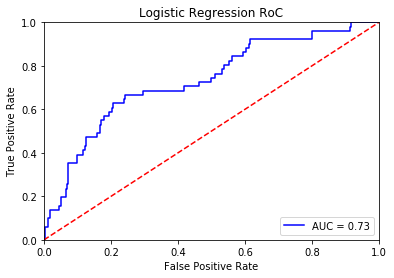

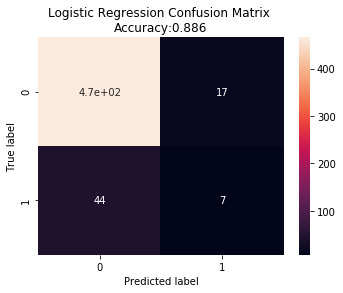

Logistic Regression  PR Curve: f1=0.187 auc=0.248


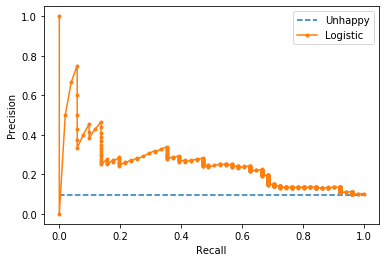

Accuracy: 	 0.8857677902621723
Recall: 	 0.13725490196078433
Precision: 	 0.2916666666666667
Specificity: 	 0.9648033126293996
NPV: 	 0.9137254901960784
F1: 		 0.18666666666666668


In [0]:
def eval(y_test, prob, y_pred, model_type):
  plot_roc(y_test, prob, model_type)
  confision_matrix(y_test, y_pred, model_type)
  plot_pr_curve(y_test, prob, y_pred, model_type)
  eval_class(y_test, y_pred)

eval(y_oh_test, lg1_prob, lg1_pred, 'Logistic Regression')

All results are 1, we are suffering from imbalanced data. Let's try Random Forest.

## 5.Random Forest - Less vunerable to imbalanced data

### (1) Modeling

In [0]:
rf1 = RandomForestClassifier(n_estimators=100).fit(X_oh_train, y_oh_train)

###(2) Prediction

In [0]:
rf1_pred = rf1.predict(X_oh_test)
rf1_prob = rf1.predict_proba(X_oh_test)

### (3) Evaluation

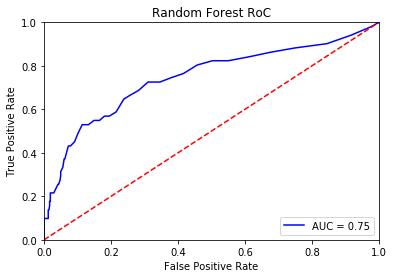

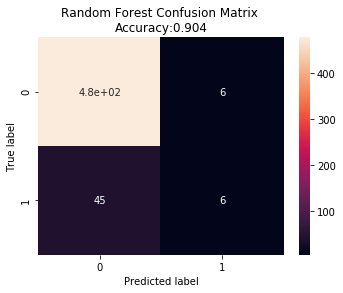

Random Forest  PR Curve: f1=0.190 auc=0.356


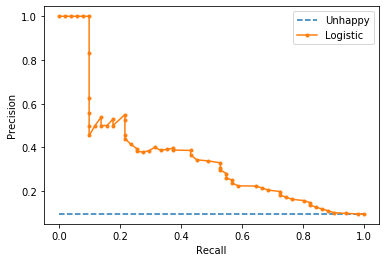

Accuracy: 	 0.9044943820224719
Recall: 	 0.11764705882352941
Precision: 	 0.5
Specificity: 	 0.9875776397515528
NPV: 	 0.9137931034482759
F1: 		 0.19047619047619047


In [0]:
eval(y_oh_test, rf1_prob, rf1_pred, 'Random Forest')

Still not perform well. Let's try to model using random split data.

## 6.CatBoost

Let me just try it.

### (1) Modeling

In [0]:
categorical_features_indices = np.where(X_cat_train.dtypes != np.float)[0]

In [0]:
# Model params
params_1 = {
    'loss_function': 'MultiClass',
    'eval_metric': 'Accuracy',
    'verbose': 10,
    'random_seed': 24,
    # 'depth':6, 
    'learning_rate':0.0001,
    'use_best_model': True,
    'l2_leaf_reg': 10,
    'bagging_temperature': 3,
    'od_type': "Iter",
    'od_wait': 100
}

cat1 = catboost.CatBoostClassifier(**params_1)
cat1.fit(X_cat_train, y_cat_train,
             eval_set = (X_cat_test, y_cat_test),
             use_best_model = True,
             cat_features = categorical_features_indices,
             plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.9018136	test: 0.8932584	best: 0.8932584 (0)	total: 154ms	remaining: 2m 33s
10:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 689ms	remaining: 1m 1s
20:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 1.23s	remaining: 57.3s
30:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 1.74s	remaining: 54.4s
40:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 2.26s	remaining: 52.9s
50:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 2.79s	remaining: 52s
60:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 3.34s	remaining: 51.4s
70:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 3.83s	remaining: 50.2s
80:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 4.35s	remaining: 49.4s
90:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 4.86s	remaining: 48.5s
100:	learn: 0.8930582	test: 0.8820225	best: 0.8932584 (0)	total: 5.37s	remaining: 47.8s
Stopped by overfitting detector  (100 iterat

### (2) Prediction

In [0]:
cat1_pred = cat1.predict(X_cat_test)
cat1_prob = cat1.predict_proba(X_cat_test)

### (3) Evaluation

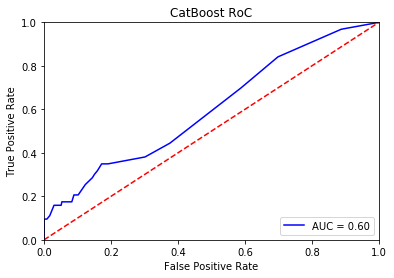

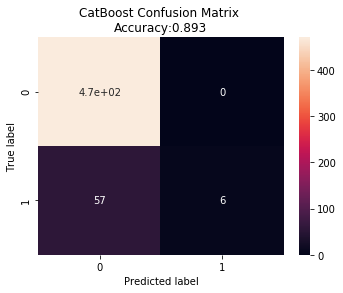

CatBoost  PR Curve: f1=0.174 auc=0.257


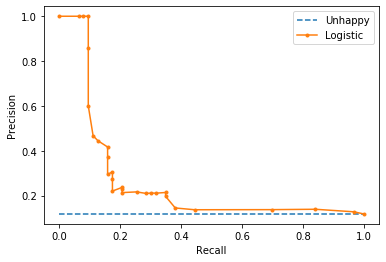

Accuracy: 	 0.8932584269662921
Recall: 	 0.09523809523809523
Precision: 	 1.0
Specificity: 	 1.0
NPV: 	 0.8920454545454546
F1: 		 0.17391304347826084


In [0]:
eval(y_cat_test, cat1_prob, cat1_pred, 'CatBoost')

In [0]:
def catboost_feature_importance(model, feature_col):
  # Extract feature importance
  feature_importance = pd.Series(model.feature_importances_)
  feature_name = pd.Series(feature_col)
  feature_importance_score = pd.DataFrame(dict(feature_name = feature_name, score = feature_importance))
  # Sort by score
  return feature_importance_score.sort_values(by='score', ascending=False)
  # print(feature_importance_score.head(20))

In [0]:
cat1_feature_score = catboost_feature_importance(cat1, X_cat_test.columns.values)
cat1_feature_score.head(20)

,feature_name,score
129,Neuroticism,43.838884
96,low_hr_10m,21.416670
152,HAN_ideal,13.043437
102,hr_std_10m,10.689745
32,steps_mean_10m,9.591887
132,NS_total,1.419377
109,rMSSD_5m,0.000000
104,hr_rest_rate_10m,0.000000
105,hr_moderate_rate_10m,0.000000
106,hr_very_active_rate_10m,0.000000


CatBoost is still suffer from imbalanced data. Let's use sampling technology to remedy imbalanced data.

## 7.Over Sample Minority Class

### (1) Upsample for Data with categorical feature

In [0]:
def upsample_data_with_cat(X_train, y_train):
  # concatenate our training data back together
  data_cat_to_sample = pd.concat([X_train, y_train], axis=1)

  # separate minority and majority classes
  unhappy_cat = data_cat_to_sample[data_cat_to_sample['valence']==1]
  happy_cat = data_cat_to_sample[data_cat_to_sample['valence']==0]


  # upsample minority
  unhappy_cat_upsampled = resample(unhappy_cat,
                            replace=True, # sample with replacement
                            n_samples=len(happy_cat), # match number in majority class
                            random_state=27) # reproducible results

  # combine majority and upsampled minority
  upsampled_cat = pd.concat([happy_cat, unhappy_cat_upsampled])

  # check new class counts
  print(upsampled_cat['valence'].value_counts())

  # Split train and test
  y_upsample_train = upsampled_cat['valence']
  X_upsample_train = upsampled_cat.drop('valence', axis=1)

  return X_upsample_train, y_upsample_train

X_cat_upsample_train, y_cat_upsample_train = upsample_data_with_cat(X_cat_train, y_cat_train)

1    1428
0    1428
Name: valence, dtype: int64


### (2) Upsample Data for design matrix with one-hot encoding

In [0]:
def upsample_data_with_oh(X_train, y_train, X_test):
  # concatenate our training data back together
  data_to_sample = pd.concat([X_train, y_train], axis=1)

  # separate minority and majority classes
  unhappy = data_to_sample[data_to_sample['valence']==1]
  happy = data_to_sample[data_to_sample['valence']==0]

  # upsample minority
  unhappy_upsampled = resample(unhappy,
                            replace=True, # sample with replacement
                            n_samples=len(happy), # match number in majority class
                            random_state=27) # reproducible results

  # combine majority and upsampled minority
  upsampled = pd.concat([happy, unhappy_upsampled])

  # check new class counts
  print(upsampled['valence'].value_counts())

  # Split train and test
  y_upsample_train = upsampled['valence']
  X_upsample_train = upsampled.drop('valence', axis=1)

  # Scale for logistic regression
  scaler = preprocessing.StandardScaler().fit(X_upsample_train)
  X_upsample_train_scaled = scaler.transform(X_upsample_train)
  X_test_scaled = scaler.transform(X_test)

  return X_upsample_train_scaled, y_upsample_train, X_test_scaled

X_oh_upsample_train_scaled, y_oh_upsample_train, X_oh_test_scaled = upsample_data_with_oh(X_oh_train, y_oh_train, X_oh_test)

1    1416
0    1416
Name: valence, dtype: int64


### (3) Logistic Regression

i. Modeling

In [0]:
lg2 = LogisticRegression(max_iter=20000)
lg2.fit(X_oh_upsample_train_scaled, y_oh_upsample_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=20000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

ii. Prediction

In [0]:
lg2_pred = lg2.predict(X_oh_test_scaled)
lg2_prob = lg2.predict_proba(X_oh_test_scaled)

iiii. Evaluation

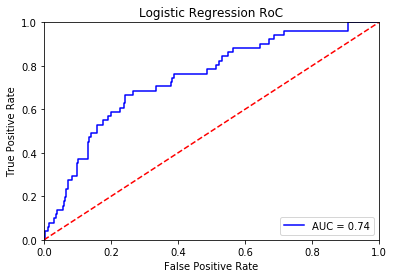

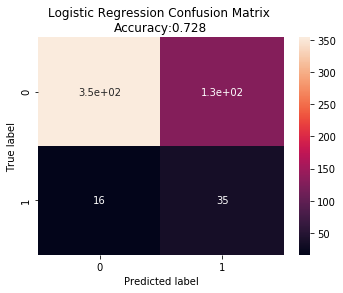

Logistic Regression  PR Curve: f1=0.326 auc=0.222


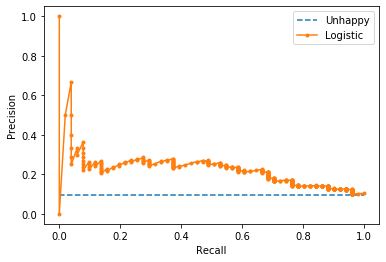

Accuracy: 	 0.7284644194756554
Recall: 	 0.6862745098039216
Precision: 	 0.21341463414634146
Specificity: 	 0.7329192546583851
NPV: 	 0.9567567567567568
F1: 		 0.32558139534883723


In [0]:
eval(y_oh_test, lg2_prob, lg2_pred, 'Logistic Regression')

As we can see, the specificity score improved drmatically, this is a good sign.

### (4) Random Forest

i. Modeling

In [0]:
rf2 = RandomForestClassifier(n_estimators=100).fit(X_oh_upsample_train_scaled, y_oh_upsample_train)

ii.Prediction

In [0]:
rf2_pred = rf2.predict(X_oh_test)
rf2_prob = rf2.predict_proba(X_oh_test)

iii.Evaluation

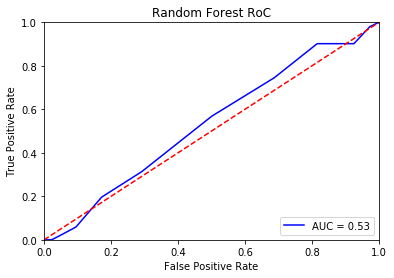

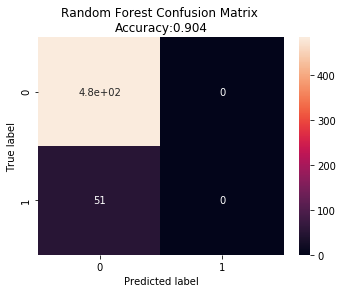

Random Forest  PR Curve: f1=0.000 auc=0.097


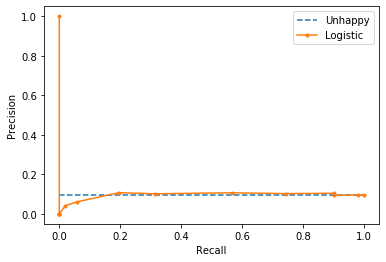

Accuracy: 	 0.9044943820224719
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.9044943820224719
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [0]:
eval(y_oh_test, rf2_prob, rf2_pred, 'Random Forest')

### (5) CatBoost

i. Modeling

In [0]:
# Model params
params_2 = {
    'loss_function': 'MultiClass',
    'eval_metric': 'Accuracy',
    'verbose': 10,
    'random_seed': 24,
    # 'depth':6, 
    'learning_rate':0.0001,
    'use_best_model': True,
    'l2_leaf_reg': 10,
    'bagging_temperature': 3,
    'od_type': "Iter",
    'od_wait': 100
}

cat2 = catboost.CatBoostClassifier(**params_2)
cat2.fit(X_cat_upsample_train, y_cat_upsample_train,
             eval_set = (X_cat_test, y_cat_test),
             cat_features = categorical_features_indices,
             use_best_model = True,
             plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6939776	test: 0.5468165	best: 0.5468165 (0)	total: 98.2ms	remaining: 1m 38s
10:	learn: 0.7762605	test: 0.7359551	best: 0.7397004 (9)	total: 744ms	remaining: 1m 6s
20:	learn: 0.7860644	test: 0.7471910	best: 0.7490637 (19)	total: 1.28s	remaining: 59.8s
30:	learn: 0.7951681	test: 0.7359551	best: 0.7490637 (19)	total: 1.82s	remaining: 56.9s
40:	learn: 0.7850140	test: 0.7284644	best: 0.7490637 (19)	total: 2.38s	remaining: 55.6s
50:	learn: 0.7895658	test: 0.7322097	best: 0.7490637 (19)	total: 2.91s	remaining: 54.2s
60:	learn: 0.8000700	test: 0.7303371	best: 0.7490637 (19)	total: 3.46s	remaining: 53.3s
70:	learn: 0.7944678	test: 0.7303371	best: 0.7490637 (19)	total: 4s	remaining: 52.4s
80:	learn: 0.7944678	test: 0.7265918	best: 0.7490637 (19)	total: 4.54s	remaining: 51.6s
90:	learn: 0.7871148	test: 0.7265918	best: 0.7490637 (19)	total: 5.09s	remaining: 50.9s
100:	learn: 0.7916667	test: 0.7228464	best: 0.7490637 (19)	total: 5.62s	remaining: 50.1s
110:	learn: 0.7899160	test: 0.72846

ii. Prediction

In [0]:
cat2_pred = cat2.predict(X_cat_test)
cat2_prob = cat2.predict_proba(X_cat_test)

iii. Evaluation

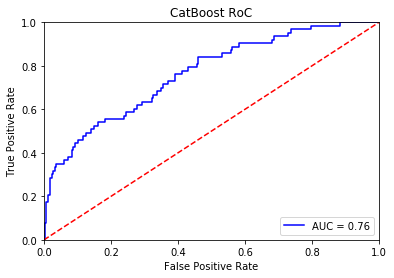

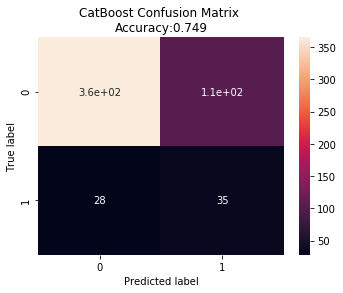

CatBoost  PR Curve: f1=0.343 auc=0.388


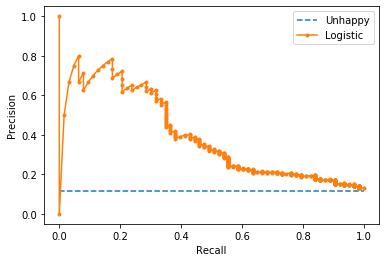

Accuracy: 	 0.7490636704119851
Recall: 	 0.5555555555555556
Precision: 	 0.24822695035460993
Specificity: 	 0.7749469214437368
NPV: 	 0.9287531806615776
F1: 		 0.3431372549019608


In [0]:
eval(y_cat_test, cat2_prob, cat2_pred, 'CatBoost')

iv. Feature evaluation

In [0]:
# Functions for feature evaluation
def log_loss(m, X, y): 
    return metrics.log_loss(y,m.predict_proba(X)[:,1])

def mse(model, y_test, X_test):
    y_pred = model.predict(X_test)
    return mean_squared_error(y_test, y_pred)

def permutation_importances(model, X, y, metric):
    baseline = metric(model, X, y)
    imp = []
    for col in X.columns:
        save = X[col].copy()
        X[col] = np.random.permutation(X[col])
        m = metric(model, X, y)
        X[col] = save
        imp.append(m-baseline)
    return np.array(imp)

def baseline_importance(model, X, y, X_test, y_test, metric):
    
    model = CatBoostClassifier(one_hot_max_size = 10, iterations = 500)
    model.fit(X, y, cat_features = categorical_features_indices, verbose = False)
    baseline = metric(model, X_test, y_test)
    
    imp = []
    for col in X.columns:
        
        save = X[col].copy()
        X[col] = np.random.permutation(X[col])
        
        model.fit(X, y, cat_features = categorical_features_indices, verbose = False)
        m = metric(model, X_test, y_test)
        X[col] = save
        imp.append(m-baseline)
    return np.array(imp)

def get_feature_imp_plot(model, method, X_train, y_train, X_test, y_test):
    
    if method == "Permutation":
        fi =  permutation_importances(model, X_test, y_test, log_loss)
    
    elif method == "Baseline":
        fi = baseline_importance(model, X_train, y_train, X_test, y_test, log_loss)
    
    elif method == "ShapValues":
        shap_values = model.get_feature_importance(Pool(X_test, label=y_test, cat_features=categorical_features_indices), 
                                                                     type="ShapValues")
        shap_values = shap_values[:,:-1]
        shap.summary_plot(shap_values, X_test) 

    elif method == "ShapValues_class":
        shap_values = model.get_feature_importance(Pool(X_test, label=y_test, cat_features=categorical_features_indices), 
                                                                     type="ShapValues")
        # SHAP value for class 1                                                             
        shap_values = shap_values[:,:,:-1]
        shap.summary_plot(shap_values[:,1], X_test) 
        
    else:
        fi = model.get_feature_importance(Pool(X_test, label=y_test, cat_features=categorical_features_indices), 
                                                                     type=method)
        
    if method != "ShapValues" and method != "ShapValues_class":
        feature_score = pd.DataFrame(list(zip(X_test.dtypes.index, fi )),
                                        columns=['Feature','Score'])

        feature_score = feature_score.sort_values(by='Score', ascending=False, inplace=False, kind='quicksort', na_position='last')

        plt.rcParams["figure.figsize"] = (60,7)
        ax = feature_score.plot('Feature', 'Score', kind='bar', color='c')
        ax.set_title("Feature Importance using {}".format(method), fontsize = 14)
        ax.set_xlabel("features")
        plt.show()

In [0]:
cat2_feature_score = catboost_feature_importance(cat2, X_cat_test.columns.values)
cat2_feature_score.head(20)

,feature_name,score
129,Neuroticism,19.729631
142,LAN_actual,11.292128
144,HAN_actual,9.213244
140,LAP_actual,7.548810
138,HAP_actual,5.174645
130,Extraversion,2.393271
136,BAS_FS,2.267522
69,high_hr_1h,1.887886
148,LAP_ideal,1.745780
51,SDNN_3h,1.642038


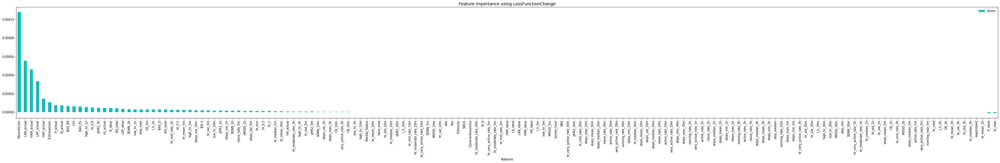

In [0]:
# from catboost import Pool
# !pip install shap
# import shap
get_feature_imp_plot(cat2, "LossFunctionChange", X_cat_upsample_train, y_cat_upsample_train, X_cat_test, y_cat_test)

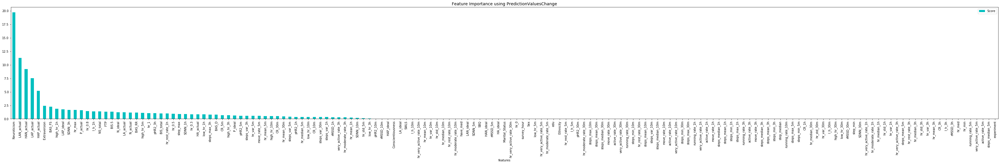

In [0]:
get_feature_imp_plot(cat2, "PredictionValuesChange", X_cat_upsample_train, y_cat_upsample_train, X_cat_test, y_cat_test)

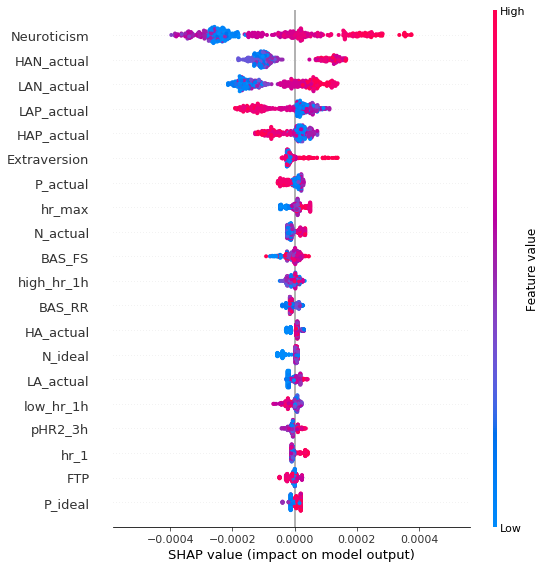

In [0]:
get_feature_imp_plot(cat2, "ShapValues_class", X_cat_upsample_train, y_cat_upsample_train, X_cat_test, y_cat_test)

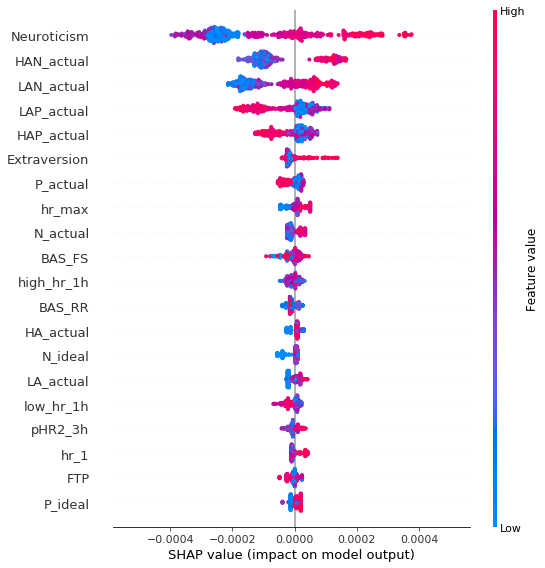

In [0]:
categorical_features_indices = np.where(X_cat_test.dtypes != np.float)[0]
shap_values = cat2.get_feature_importance(catboost.Pool(X_cat_test, label=y_cat_test, cat_features=categorical_features_indices), type="ShapValues")
shap_values = shap_values[:,:,:-1]

# SHAP values for formula raw predictions for class 1.
shap.summary_plot(shap_values[:,1], X_cat_test)

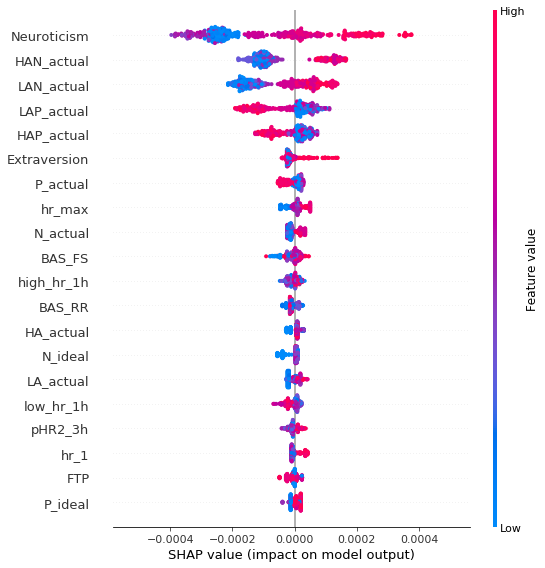

In [0]:
# SHAP values for formula raw predictions for class 0.
shap.summary_plot(shap_values[:,1], X_cat_test)

In [0]:
X_cat_test.shape

(533, 2, 162)

In [0]:
shap_values[:,:-1]

array([], shape=(533, 0, 162), dtype=float64)

### (6) Cross Validation

i Scoring criteria

In [0]:
scoring = {
    'precision': 'precision',
    'recall': 'recall',
    'roc_auc':'roc_auc',
    'accuracy': 'accuracy',
    'f1': 'f1',
    'neg_log_loss': 'neg_log_loss'
}

ii. Cross validate with CatBoost

In [0]:
cat_upsample_result = []
skf = StratifiedKFold(n_splits=4, random_state=27, shuffle=False)
for train_index, test_index in skf.split(X_cat, group_cat):
  # Stratified Split
  X_cat_train, X_cat_test = X_cat.iloc[train_index], X_cat.iloc[test_index]
  y_cat_train, y_cat_test = y_cat.iloc[train_index], y_cat.iloc[test_index]
  # Up sample
  X_cat_upsample_train, y_cat_upsample_train = upsample_data_with_cat(X_cat_train, y_cat_train)
  # CatBoost
  cat = catboost.CatBoostClassifier(**params_2)
  cat.fit(X_cat_upsample_train, y_cat_upsample_train,
             eval_set = (X_cat_test, y_cat_test),
             cat_features = categorical_features_indices,
             use_best_model = True,
             plot=True)
  cat_pred = cat.predict(X_cat_test)
  cat_res = eval_class(y_cat_test, cat_pred)
  cat_upsample_result.append(cat_res)

1    1417
0    1417
Name: valence, dtype: int64


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=4.
  % (min_groups, self.n_splits)), UserWarning)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7134792	test: 0.5711610	best: 0.5711610 (0)	total: 170ms	remaining: 2m 50s
10:	learn: 0.7974594	test: 0.7865169	best: 0.7921348 (9)	total: 707ms	remaining: 1m 3s
20:	learn: 0.8126323	test: 0.7940075	best: 0.8014981 (15)	total: 1.25s	remaining: 58.1s
30:	learn: 0.8020466	test: 0.7883895	best: 0.8014981 (15)	total: 1.78s	remaining: 55.8s
40:	learn: 0.7946366	test: 0.7752809	best: 0.8014981 (15)	total: 2.34s	remaining: 54.8s
50:	learn: 0.7900494	test: 0.7752809	best: 0.8014981 (15)	total: 2.87s	remaining: 53.5s
60:	learn: 0.7964008	test: 0.7752809	best: 0.8014981 (15)	total: 3.42s	remaining: 52.7s
70:	learn: 0.7882851	test: 0.7752809	best: 0.8014981 (15)	total: 3.98s	remaining: 52s
80:	learn: 0.7882851	test: 0.7771536	best: 0.8014981 (15)	total: 4.51s	remaining: 51.2s
90:	learn: 0.7893437	test: 0.7771536	best: 0.8014981 (15)	total: 5.05s	remaining: 50.5s
100:	learn: 0.7879323	test: 0.7752809	best: 0.8014981 (15)	total: 5.59s	remaining: 49.8s
110:	learn: 0.7900494	test: 0.78089

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7260563	test: 0.7073171	best: 0.7073171 (0)	total: 101ms	remaining: 1m 41s
10:	learn: 0.8179577	test: 0.7992495	best: 0.7992495 (10)	total: 734ms	remaining: 1m 6s
20:	learn: 0.8080986	test: 0.7992495	best: 0.8030019 (14)	total: 1.27s	remaining: 59.4s
30:	learn: 0.7968310	test: 0.7917448	best: 0.8030019 (14)	total: 1.82s	remaining: 56.8s
40:	learn: 0.8105634	test: 0.7879925	best: 0.8030019 (14)	total: 2.35s	remaining: 55.1s
50:	learn: 0.8126761	test: 0.7861163	best: 0.8030019 (14)	total: 2.9s	remaining: 53.9s
60:	learn: 0.8091549	test: 0.7861163	best: 0.8030019 (14)	total: 3.44s	remaining: 53s
70:	learn: 0.8144366	test: 0.7973734	best: 0.8030019 (14)	total: 4s	remaining: 52.3s
80:	learn: 0.8080986	test: 0.7917448	best: 0.8030019 (14)	total: 4.54s	remaining: 51.6s
90:	learn: 0.8077465	test: 0.7936210	best: 0.8030019 (14)	total: 5.1s	remaining: 51s
100:	learn: 0.8119718	test: 0.7879925	best: 0.8030019 (14)	total: 5.64s	remaining: 50.2s
110:	learn: 0.8024648	test: 0.7954972	bes

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7205882	test: 0.7035647	best: 0.7035647 (0)	total: 123ms	remaining: 2m 2s
10:	learn: 0.8105742	test: 0.7879925	best: 0.7879925 (10)	total: 718ms	remaining: 1m 4s
20:	learn: 0.8154762	test: 0.8048780	best: 0.8142589 (16)	total: 1.26s	remaining: 59s
30:	learn: 0.8203782	test: 0.7842402	best: 0.8142589 (16)	total: 1.8s	remaining: 56.2s
40:	learn: 0.8193277	test: 0.7898687	best: 0.8142589 (16)	total: 2.35s	remaining: 54.9s
50:	learn: 0.8119748	test: 0.7842402	best: 0.8142589 (16)	total: 2.89s	remaining: 53.8s
60:	learn: 0.8151261	test: 0.7767355	best: 0.8142589 (16)	total: 3.46s	remaining: 53.2s
70:	learn: 0.8203782	test: 0.7748593	best: 0.8142589 (16)	total: 4s	remaining: 52.3s
80:	learn: 0.8116246	test: 0.7692308	best: 0.8142589 (16)	total: 4.54s	remaining: 51.5s
90:	learn: 0.8137255	test: 0.7636023	best: 0.8142589 (16)	total: 5.09s	remaining: 50.8s
100:	learn: 0.8126751	test: 0.7654784	best: 0.8142589 (16)	total: 5.64s	remaining: 50.2s
110:	learn: 0.8105742	test: 0.7673546	b

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7084497	test: 0.5328330	best: 0.5328330 (0)	total: 122ms	remaining: 2m 1s
10:	learn: 0.8037709	test: 0.7673546	best: 0.7673546 (8)	total: 717ms	remaining: 1m 4s
20:	learn: 0.8226257	test: 0.7767355	best: 0.7861163 (14)	total: 1.26s	remaining: 58.6s
30:	learn: 0.8271648	test: 0.7579737	best: 0.7861163 (14)	total: 1.8s	remaining: 56.2s
40:	learn: 0.8282123	test: 0.7786116	best: 0.7861163 (14)	total: 2.35s	remaining: 54.9s
50:	learn: 0.8275140	test: 0.7711069	best: 0.7861163 (14)	total: 2.89s	remaining: 53.7s
60:	learn: 0.8299581	test: 0.7767355	best: 0.7861163 (14)	total: 3.47s	remaining: 53.4s
70:	learn: 0.8324022	test: 0.7767355	best: 0.7861163 (14)	total: 4.02s	remaining: 52.6s
80:	learn: 0.8282123	test: 0.7823640	best: 0.7861163 (14)	total: 4.57s	remaining: 51.8s
90:	learn: 0.8334497	test: 0.7748593	best: 0.7861163 (14)	total: 5.12s	remaining: 51.1s
100:	learn: 0.8299581	test: 0.7711069	best: 0.7861163 (14)	total: 5.67s	remaining: 50.4s
110:	learn: 0.8271648	test: 0.77861

iii. Cross validate with Logistic Regression and Random Forest

In [0]:
rf_upsample_result = []
lg_upsample_result = []

skf = StratifiedKFold(n_splits=4, random_state=27, shuffle=False)
for train_index, test_index in skf.split(X_oh, group_oh):
  # Stratified Split
  X_oh_train, X_oh_test = X_oh.iloc[train_index], X_oh.iloc[test_index]
  y_oh_train, y_oh_test = y_oh.iloc[train_index], y_oh.iloc[test_index]
  # Up sample
  X_oh_upsample_train_scaled, y_oh_upsample_train, X_oh_test_scaled = upsample_data_with_oh(X_oh_train, y_oh_train, X_oh_test)
  # Logistic
  lg = LogisticRegression(max_iter=20000)
  lg.fit(X_oh_upsample_train_scaled, y_oh_upsample_train)
  lg_pred = lg.predict(X_oh_test_scaled)
  lg_res = eval_class(y_oh_test, lg_pred)
  lg_upsample_result.append(lg_res)
  # Random Forest
  rf = RandomForestClassifier(n_estimators=100).fit(X_oh_upsample_train_scaled, y_oh_upsample_train)
  rf_pred = rf.predict(X_oh_test)
  rf_res = eval_class(y_oh_test, rf_pred)
  rf_upsample_result.append(rf_res)

1    1417
0    1417
Name: valence, dtype: int64


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=4.
  % (min_groups, self.n_splits)), UserWarning)


Accuracy: 	 0.6554307116104869
Recall: 	 0.6730769230769231
Precision: 	 0.17326732673267325
Specificity: 	 0.6535269709543569
NPV: 	 0.9487951807228916
F1: 		 0.2755905511811024


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 	 0.9026217228464419
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.9026217228464419
F1: 		 0.0
1    1420
0    1420
Name: valence, dtype: int64
Accuracy: 	 0.7091932457786116
Recall: 	 0.6481481481481481
Precision: 	 0.2046783625730994
Specificity: 	 0.7160751565762005
NPV: 	 0.9475138121546961
F1: 		 0.31111111111111106


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 	 0.8986866791744841
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.8986866791744841
F1: 		 0.0
1    1428
0    1428
Name: valence, dtype: int64
Accuracy: 	 0.6547842401500938
Recall: 	 0.6129032258064516
Precision: 	 0.1919191919191919
Specificity: 	 0.6602972399150743
NPV: 	 0.9283582089552239
F1: 		 0.29230769230769227


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 	 0.8836772983114447
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.8836772983114447
F1: 		 0.0
1    1432
0    1432
Name: valence, dtype: int64
Accuracy: 	 0.6923076923076923
Recall: 	 0.6818181818181818
Precision: 	 0.2393617021276596
Specificity: 	 0.6937901498929336
NPV: 	 0.9391304347826087
F1: 		 0.3543307086614173
Accuracy: 	 0.8761726078799249
Recall: 	 0.0
Precision: 	 0.0
Specificity: 	 1.0
NPV: 	 0.8761726078799249
F1: 		 0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


iii. Post Processing

In [0]:
lg_avg_eval = np.mean(lg_upsample_result, axis=0)
lg_avg_eval = np.append('Logistic', lg_avg_eval)

rf_avg_eval = np.mean(rf_upsample_result, axis=0)
rf_avg_eval = np.append('Random Forest', rf_avg_eval)

cat_avg_eval = np.mean(cat_upsample_result, axis=0)
cat_avg_eval = np.append('CatBoost', cat_avg_eval)

data = [lg_avg_eval, rf_avg_eval, cat_avg_eval]
cv_upsample_res = pd.DataFrame(data=data, columns=['model', 'accuracy', 'recall', 'precision', 'specificity', 'npv', 'f1'])

iv. Result

In [0]:
cv_upsample_res

,model,accuracy,recall,precision,specificity,npv,f1
0,Logistic,0.6779289724617212,0.6539866197124261,0.20230664583815605,0.6809223793346413,0.940949409153855,0.30833501581533074
1,Random Forest,0.890289577053074,0.0,0.0,1.0,0.890289577053074,0.0
2,CatBoost,0.801218809508752,0.6154634642537868,0.3010899541071955,0.8241052421598551,0.945556976270649,0.40382214429108093


### *Could further look into feature importance*

## 7.Under Sample Majority Class

### (1) Undersample for Data with categorical features

In [0]:
def downsample_data_with_cat(X_train, y_train):
  # concatenate our training data back together
  data_cat_to_sample = pd.concat([X_train, y_train], axis=1)

  # separate minority and majority classes
  unhappy_cat = data_cat_to_sample[data_cat_to_sample['valence']==1]
  happy_cat = data_cat_to_sample[data_cat_to_sample['valence']==0]
  # downsample majority
  happy_cat_downsampled = resample(happy_cat,
                                  replace = False, # sample without replacement
                                  n_samples = len(unhappy_cat), # match minority n
                                  random_state = 27) # reproducible results

  # combine minority and downsampled majority
  downsampled_cat = pd.concat([happy_cat_downsampled, unhappy_cat])

  # checking counts
  downsampled_cat['valence'].value_counts()

  # Split train and test
  y_cat_downsample_train = downsampled_cat['valence']
  X_cat_downsample_train = downsampled_cat.drop('valence', axis=1)
  return X_cat_downsample_train, y_cat_downsample_train

X_cat_downsample_train, y_cat_downsample_train = downsample_data_with_cat(X_cat_train, y_cat_train)

### (2) Undersample for Data with one-hot encoding

In [0]:
def downsample_data_with_oh(X_train, y_train, X_test):
  # concatenate our training data back together
  data_oh_to_sample = pd.concat([X_oh_train, y_oh_train], axis=1)


  # separate minority and majority classes
  unhappy_oh = data_oh_to_sample[data_oh_to_sample['valence']==1]
  happy_oh = data_oh_to_sample[data_oh_to_sample['valence']==0]


  # upsample minority
  happy_oh_downsampled = resample(happy_oh,
                            replace=True, # sample with replacement
                            n_samples=len(unhappy_oh), # match number in majority class
                            random_state=27) # reproducible results

  # combine majority and upsampled minority
  downsampled_oh = pd.concat([unhappy_oh, happy_oh_downsampled])

  # check new class counts
  print(downsampled_oh['valence'].value_counts())

  # Split train and test
  y_oh_downsample_train = downsampled_oh['valence']
  X_oh_downsample_train = downsampled_oh.drop('valence', axis=1)

  # Scale for logistic regression
  scaler = preprocessing.StandardScaler().fit(X_oh_downsample_train)
  X_oh_downsample_train_scaled = scaler.transform(X_oh_downsample_train)
  X_oh_test_scaled = scaler.transform(X_test)
  return X_oh_downsample_train_scaled, y_oh_downsample_train, X_oh_test_scaled


X_oh_downsample_train_scaled, y_oh_downsample_train, X_oh_test_scaled = downsample_data_with_oh(X_oh_train, y_oh_train, X_oh_test)


1    168
0    168
Name: valence, dtype: int64


### (3) Logistic Regression

i. Modeling

In [0]:
lg3 = LogisticRegression(max_iter=20000)
lg3.fit(X_oh_downsample_train_scaled, y_oh_downsample_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=20000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

iii. Prediction

In [0]:
lg3_pred = lg3.predict(X_oh_test_scaled)
lg3_prob = lg3.predict_proba(X_oh_test_scaled)

iv. Evaluation

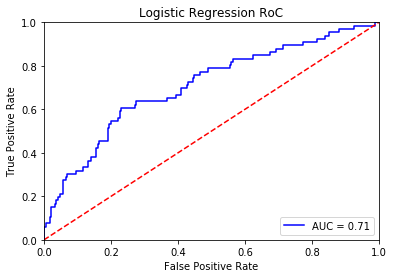

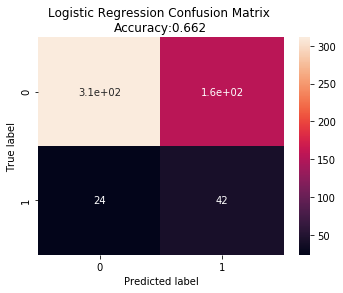

Logistic Regression  PR Curve: f1=0.318 auc=0.314


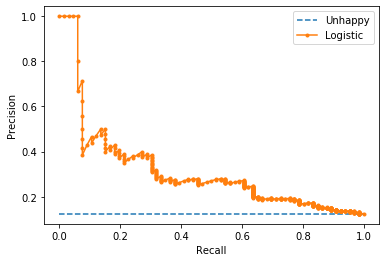

Accuracy: 	 0.6622889305816135
Recall: 	 0.6363636363636364
Precision: 	 0.21212121212121213
Specificity: 	 0.6659528907922913
NPV: 	 0.9283582089552239
F1: 		 0.3181818181818182


In [0]:
eval(y_oh_test, lg3_prob, lg3_pred, 'Logistic Regression')

### (4) Random Forest

i. Modeling

In [0]:
rf3 = RandomForestClassifier(n_estimators=100).fit(X_oh_downsample_train_scaled, y_oh_downsample_train)

ii. Prediction

In [0]:
rf3_pred = rf3.predict(X_oh_test_scaled)
rf3_prob = rf3.predict_proba(X_oh_test_scaled)

iii. Evaluation

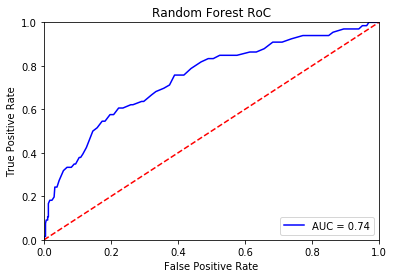

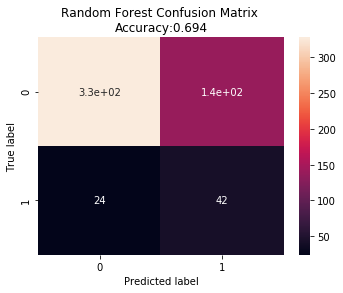

Random Forest  PR Curve: f1=0.340 auc=0.346


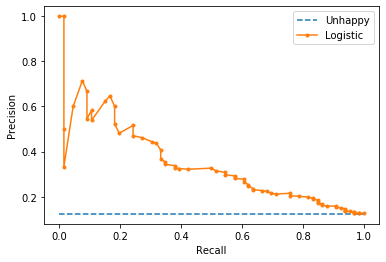

Accuracy: 	 0.6941838649155723
Recall: 	 0.6363636363636364
Precision: 	 0.23204419889502761
Specificity: 	 0.702355460385439
NPV: 	 0.9318181818181818
F1: 		 0.3400809716599191


In [0]:
eval(y_oh_test, rf3_prob, rf3_pred, 'Random Forest')

### (5) CatBoost

i. Modeling

In [0]:
# Model params
params_3 = {
    'loss_function': 'MultiClass',
    'eval_metric': 'Accuracy',
    'verbose': 10,
    'random_seed': 24,
    # 'depth':6, 
    'learning_rate':0.0001,
    'use_best_model': True,
    'l2_leaf_reg': 10,
    'bagging_temperature': 3,
    'od_type': "Iter",
    'od_wait': 300
}

cat3 = catboost.CatBoostClassifier(**params_3)
cat3.fit(X_cat_downsample_train, y_cat_downsample_train,
             eval_set = (X_cat_test, y_cat_test),
             cat_features = categorical_features_indices,
             use_best_model = True,
             plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6964286	test: 0.7654784	best: 0.7654784 (0)	total: 58.1ms	remaining: 58.1s
10:	learn: 0.7767857	test: 0.6772983	best: 0.7654784 (0)	total: 609ms	remaining: 54.8s
20:	learn: 0.7976190	test: 0.6791745	best: 0.7654784 (0)	total: 1.07s	remaining: 50.1s
30:	learn: 0.7976190	test: 0.6397749	best: 0.7654784 (0)	total: 1.47s	remaining: 46.1s
40:	learn: 0.8035714	test: 0.6285178	best: 0.7654784 (0)	total: 1.87s	remaining: 43.7s
50:	learn: 0.7946429	test: 0.6341463	best: 0.7654784 (0)	total: 2.27s	remaining: 42.3s
60:	learn: 0.7946429	test: 0.6228893	best: 0.7654784 (0)	total: 2.68s	remaining: 41.3s
70:	learn: 0.7976190	test: 0.6285178	best: 0.7654784 (0)	total: 3.09s	remaining: 40.4s
80:	learn: 0.7976190	test: 0.6210131	best: 0.7654784 (0)	total: 3.5s	remaining: 39.7s
90:	learn: 0.8065476	test: 0.6285178	best: 0.7654784 (0)	total: 3.9s	remaining: 39s
100:	learn: 0.8095238	test: 0.6210131	best: 0.7654784 (0)	total: 4.32s	remaining: 38.5s
110:	learn: 0.8184524	test: 0.6285178	best: 0.

ii. Prediction

In [0]:
cat3_pred = cat3.predict(X_cat_test)
cat3_prob = cat3.predict_proba(X_cat_test)

iii. Evaluation

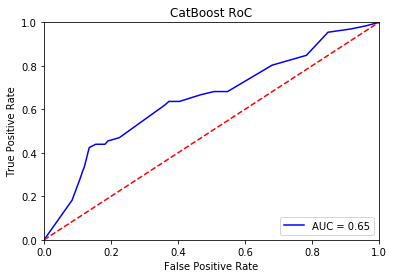

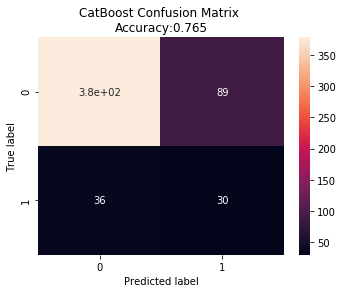

CatBoost  PR Curve: f1=0.324 auc=0.278


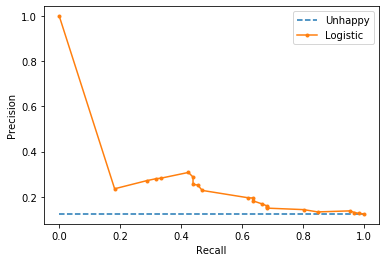

Accuracy: 	 0.7654784240150094
Recall: 	 0.45454545454545453
Precision: 	 0.25210084033613445
Specificity: 	 0.8094218415417559
NPV: 	 0.9130434782608695
F1: 		 0.3243243243243243


In [0]:
eval(y_cat_test, cat3_prob, cat3_pred, 'CatBoost')

In [0]:
cat3_feature_score = catboost_feature_importance(cat3, X_cat_test.columns.values)
cat3_feature_score.head(20)

,feature_name,score
141,LA_actual,37.257486
128,SWLS,27.037024
127,FTP,23.421664
10,very_active_rate_3h,7.632512
52,pHR2_3h,2.518358
124,hr_0.8,2.132955
104,hr_rest_rate_10m,0.000000
105,hr_moderate_rate_10m,0.000000
106,hr_very_active_rate_10m,0.000000
107,SDNN_5m,0.000000


### (6) Cross Validation

i. Cross Validation for CatBoost

In [0]:
cat_downsample_result = []
skf = StratifiedKFold(n_splits=4, random_state=27, shuffle=False)
for train_index, test_index in skf.split(X_cat, group_cat):
  # Stratified Split
  X_cat_train, X_cat_test = X_cat.iloc[train_index], X_cat.iloc[test_index]
  y_cat_train, y_cat_test = y_cat.iloc[train_index], y_cat.iloc[test_index]
  # Up sample
  X_cat_downsample_train, y_cat_downsample_train = downsample_data_with_cat(X_cat_train, y_cat_train)
  # CatBoost
  cat = catboost.CatBoostClassifier(**params_2)
  cat.fit(X_cat_downsample_train, y_cat_downsample_train,
             eval_set = (X_cat_test, y_cat_test),
             cat_features = categorical_features_indices,
             use_best_model = True,
             plot=True)
  cat_pred = cat.predict(X_cat_test)
  cat_res = eval_class(y_cat_test, cat_pred)
  cat_downsample_result.append(cat_res)

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=4.
  % (min_groups, self.n_splits)), UserWarning)


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7142857	test: 0.5880150	best: 0.5880150 (0)	total: 79.8ms	remaining: 1m 19s
10:	learn: 0.7664835	test: 0.6891386	best: 0.6910112 (6)	total: 608ms	remaining: 54.6s
20:	learn: 0.7994505	test: 0.7228464	best: 0.7228464 (20)	total: 1.02s	remaining: 47.4s
30:	learn: 0.7994505	test: 0.7097378	best: 0.7228464 (20)	total: 1.42s	remaining: 44.3s
40:	learn: 0.8049451	test: 0.7059925	best: 0.7228464 (20)	total: 1.82s	remaining: 42.6s
50:	learn: 0.7939560	test: 0.7153558	best: 0.7228464 (20)	total: 2.25s	remaining: 41.9s
60:	learn: 0.7967033	test: 0.7134831	best: 0.7228464 (20)	total: 2.66s	remaining: 40.9s
70:	learn: 0.7994505	test: 0.7284644	best: 0.7284644 (70)	total: 3.08s	remaining: 40.2s
80:	learn: 0.8021978	test: 0.7228464	best: 0.7284644 (70)	total: 3.48s	remaining: 39.5s
90:	learn: 0.8021978	test: 0.7209738	best: 0.7284644 (70)	total: 3.88s	remaining: 38.8s
100:	learn: 0.8049451	test: 0.7153558	best: 0.7284644 (70)	total: 4.31s	remaining: 38.4s
110:	learn: 0.8021978	test: 0.72

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7000000	test: 0.5853659	best: 0.5853659 (0)	total: 79.7ms	remaining: 1m 19s
10:	learn: 0.7722222	test: 0.6210131	best: 0.6454034 (8)	total: 580ms	remaining: 52.2s
20:	learn: 0.7472222	test: 0.6341463	best: 0.6735460 (14)	total: 997ms	remaining: 46.5s
30:	learn: 0.7833333	test: 0.6435272	best: 0.6735460 (14)	total: 1.43s	remaining: 44.7s
40:	learn: 0.8083333	test: 0.6266417	best: 0.6735460 (14)	total: 1.83s	remaining: 42.8s
50:	learn: 0.8222222	test: 0.6566604	best: 0.6735460 (14)	total: 2.25s	remaining: 41.8s
60:	learn: 0.8250000	test: 0.6772983	best: 0.6772983 (60)	total: 2.66s	remaining: 40.9s
70:	learn: 0.8250000	test: 0.6923077	best: 0.6941839 (68)	total: 3.08s	remaining: 40.3s
80:	learn: 0.8194444	test: 0.6941839	best: 0.6998124 (75)	total: 3.49s	remaining: 39.6s
90:	learn: 0.8194444	test: 0.6998124	best: 0.7054409 (84)	total: 3.9s	remaining: 38.9s
100:	learn: 0.8250000	test: 0.7016886	best: 0.7073171 (92)	total: 4.33s	remaining: 38.5s
110:	learn: 0.8166667	test: 0.707

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7005814	test: 0.6547842	best: 0.6547842 (0)	total: 57.9ms	remaining: 57.8s
10:	learn: 0.8197674	test: 0.6116323	best: 0.6547842 (0)	total: 588ms	remaining: 52.9s
20:	learn: 0.8313953	test: 0.6153846	best: 0.6547842 (0)	total: 992ms	remaining: 46.2s
30:	learn: 0.8517442	test: 0.6266417	best: 0.6547842 (0)	total: 1.4s	remaining: 43.7s
40:	learn: 0.8517442	test: 0.6322702	best: 0.6547842 (0)	total: 1.81s	remaining: 42.4s
50:	learn: 0.8633721	test: 0.6510319	best: 0.6547842 (0)	total: 2.22s	remaining: 41.3s
60:	learn: 0.8546512	test: 0.6735460	best: 0.6810507 (58)	total: 2.63s	remaining: 40.5s
70:	learn: 0.8459302	test: 0.6754221	best: 0.6810507 (58)	total: 3.05s	remaining: 40s
80:	learn: 0.8488372	test: 0.6697936	best: 0.6866792 (78)	total: 3.46s	remaining: 39.3s
90:	learn: 0.8488372	test: 0.6791745	best: 0.6866792 (78)	total: 3.87s	remaining: 38.7s
100:	learn: 0.8488372	test: 0.6754221	best: 0.6904315 (94)	total: 4.3s	remaining: 38.3s
110:	learn: 0.8459302	test: 0.6998124	bes

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6964286	test: 0.7654784	best: 0.7654784 (0)	total: 54.9ms	remaining: 54.8s
10:	learn: 0.7767857	test: 0.6772983	best: 0.7654784 (0)	total: 575ms	remaining: 51.7s
20:	learn: 0.7976190	test: 0.6791745	best: 0.7654784 (0)	total: 968ms	remaining: 45.1s
30:	learn: 0.7976190	test: 0.6397749	best: 0.7654784 (0)	total: 1.37s	remaining: 42.7s
40:	learn: 0.8035714	test: 0.6285178	best: 0.7654784 (0)	total: 1.76s	remaining: 41.1s
50:	learn: 0.7946429	test: 0.6341463	best: 0.7654784 (0)	total: 2.17s	remaining: 40.4s
60:	learn: 0.7946429	test: 0.6228893	best: 0.7654784 (0)	total: 2.57s	remaining: 39.6s
70:	learn: 0.7976190	test: 0.6285178	best: 0.7654784 (0)	total: 2.97s	remaining: 38.8s
80:	learn: 0.7976190	test: 0.6210131	best: 0.7654784 (0)	total: 3.39s	remaining: 38.5s
90:	learn: 0.8065476	test: 0.6285178	best: 0.7654784 (0)	total: 3.8s	remaining: 37.9s
100:	learn: 0.8095238	test: 0.6210131	best: 0.7654784 (0)	total: 4.21s	remaining: 37.5s
Stopped by overfitting detector  (100 itera

ii. Cross Validation with Logistic Regression and Random Forest

In [0]:
rf_downsample_result = []
lg_downsample_result = []

skf = StratifiedKFold(n_splits=4, random_state=27, shuffle=False)
for train_index, test_index in skf.split(X_oh, group_oh):
  # Stratified Split
  X_oh_train, X_oh_test = X_oh.iloc[train_index], X_oh.iloc[test_index]
  y_oh_train, y_oh_test = y_oh.iloc[train_index], y_oh.iloc[test_index]
  # Up sample
  X_oh_downsample_train_scaled, y_oh_downsample_train, X_oh_test_scaled = downsample_data_with_oh(X_oh_train, y_oh_train, X_oh_test)
  # Logistic
  lg = LogisticRegression(max_iter=20000)
  lg.fit(X_oh_downsample_train_scaled, y_oh_downsample_train)
  lg_pred = lg.predict(X_oh_test_scaled)
  lg_res = eval_class(y_oh_test, lg_pred)
  lg_downsample_result.append(lg_res)
  # Random Forest
  rf = RandomForestClassifier(n_estimators=100).fit(X_oh_downsample_train_scaled, y_oh_downsample_train)
  rf_pred = rf.predict(X_oh_test)
  rf_res = eval_class(y_oh_test, rf_pred)
  rf_downsample_result.append(rf_res)

1    182
0    182
Name: valence, dtype: int64
Accuracy: 	 0.5730337078651685
Recall: 	 0.7307692307692307
Precision: 	 0.15079365079365079
Specificity: 	 0.5560165975103735
NPV: 	 0.950354609929078
F1: 		 0.24999999999999997


/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=4.
  % (min_groups, self.n_splits)), UserWarning)


Accuracy: 	 0.14606741573033707
Recall: 	 0.9423076923076923
Precision: 	 0.09760956175298804
Specificity: 	 0.06016597510373444
NPV: 	 0.90625
F1: 		 0.1768953068592058
1    180
0    180
Name: valence, dtype: int64
Accuracy: 	 0.6322701688555347
Recall: 	 0.7407407407407407
Precision: 	 0.18018018018018017
Specificity: 	 0.6200417536534447
NPV: 	 0.954983922829582
F1: 		 0.2898550724637681
Accuracy: 	 0.874296435272045
Recall: 	 0.037037037037037035
Precision: 	 0.11764705882352941
Specificity: 	 0.9686847599164927
NPV: 	 0.8992248062015504
F1: 		 0.05633802816901408
1    172
0    172
Name: valence, dtype: int64
Accuracy: 	 0.5872420262664165
Recall: 	 0.6774193548387096
Precision: 	 0.17355371900826447
Specificity: 	 0.5753715498938429
NPV: 	 0.9312714776632303
F1: 		 0.2763157894736842
Accuracy: 	 0.350844277673546
Recall: 	 0.7903225806451613
Precision: 	 0.12827225130890052
Specificity: 	 0.2929936305732484
NPV: 	 0.9139072847682119
F1: 		 0.22072072072072071
1    168
0    168
Nam

iii. Post processing

In [0]:
lg_avg_eval = np.mean(lg_downsample_result, axis=0)
lg_avg_eval = np.append('Logistic', lg_avg_eval)

rf_avg_eval = np.mean(rf_downsample_result, axis=0)
rf_avg_eval = np.append('Random Forest', rf_avg_eval)

cat_avg_eval = np.mean(cat_downsample_result, axis=0)
cat_avg_eval = np.append('CatBoost', cat_avg_eval)

data = [lg_avg_eval, rf_avg_eval, cat_avg_eval]
cv_downsample_res = pd.DataFrame(data=data, columns=['model', 'accuracy', 'recall', 'precision', 'specificity', 'npv', 'f1'])

iii. Result

In [0]:
cv_downsample_res

,model,accuracy,recall,precision,specificity,npv,f1
0,Logistic,0.6137087083921833,0.6963232406780793,0.17916219052582688,0.6043456979624882,0.9412420548442786,0.2835881700298176
1,Random Forest,0.4225393680038788,0.6015077365883817,0.11344127308946472,0.3989835753384117,0.8903718385319143,0.1604683797090472
2,CatBoost,0.7313656358257619,0.5815506178409404,0.2234176504410525,0.7506696254993237,0.9356575657550171,0.3198798679156972


## 8.Generate Synthetic Samples (SMOTE)

### (1) Generate New Samples for Data with categorical features

In [0]:
sm = SMOTE(random_state=27, ratio=1.0)
X_oh_smo_train, y_oh_smo_train = sm.fit_sample(X_oh_train, y_oh_train)
X_oh_smocat_train, y_oh_smocat_train = sm.fit_sample(X_ohcat_train, y_ohcat_train)

# SMOTE could not handle categorical data well, let's only usng one-hot first
# from imblearn.over_sampling import SMOTENC
# sm_nc = SMOTENC(categorical_features=categorical_features_indices, random_state=27)
# X_cat_smo_train, y_cat_smo_train = sm_nc.fit_sample(X_cat_train, y_cat_train)

scaler = preprocessing.StandardScaler().fit(X_oh_smo_train)
X_oh_smo_train_scaled = scaler.transform(X_oh_smo_train)
X_oh_test_scaled = scaler.transform(X_oh_test)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


### (2) Logistic Regression

i. Modeling

In [0]:
lg4 = LogisticRegression(max_iter=20000)
lg4.fit(X_oh_smo_train_scaled, y_oh_smo_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=20000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

iii. Prediction

In [0]:
lg4_pred = lg4.predict(X_oh_test_scaled)
lg4_prob = lg4.predict_proba(X_oh_test_scaled)

iv. Evaluation

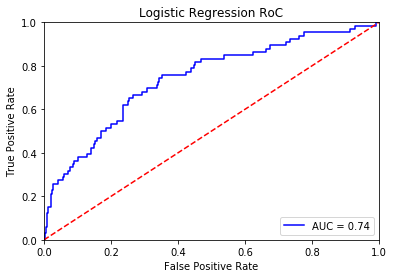

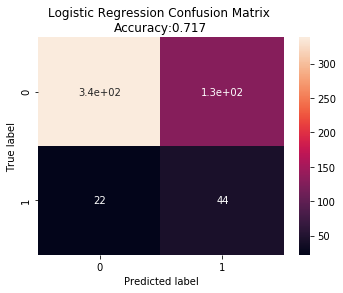

Logistic Regression  PR Curve: f1=0.368 auc=0.333


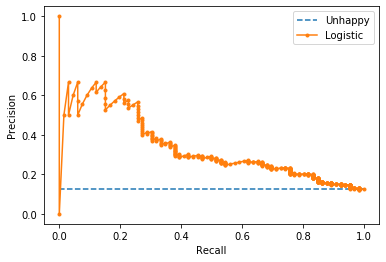

Accuracy: 	 0.7166979362101313
Recall: 	 0.6666666666666666
Precision: 	 0.2543352601156069
Specificity: 	 0.7237687366167024
NPV: 	 0.9388888888888889
F1: 		 0.3682008368200837


In [0]:
eval(y_oh_test, lg4_prob, lg4_pred, 'Logistic Regression')

### (3) Random Forest

i. Modeling

In [0]:
rf4 = RandomForestClassifier(n_estimators=100).fit(X_oh_smo_train_scaled, y_oh_smo_train)

ii. Prediction

In [0]:
rf4_pred = rf4.predict(X_oh_test_scaled)
rf4_prob = rf4.predict_proba(X_oh_test_scaled)

iii. Evaluation

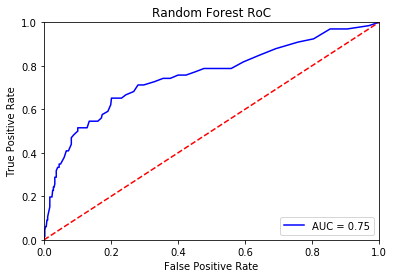

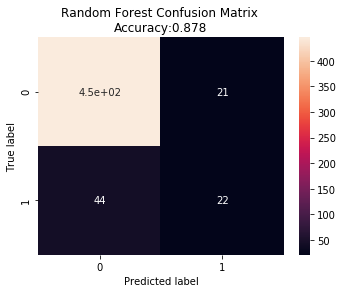

Random Forest  PR Curve: f1=0.404 auc=0.389


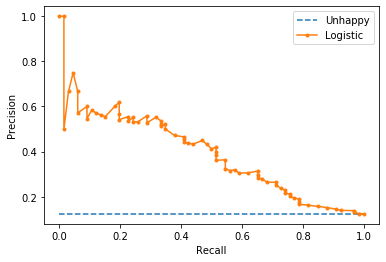

Accuracy: 	 0.8780487804878049
Recall: 	 0.3333333333333333
Precision: 	 0.5116279069767442
Specificity: 	 0.9550321199143469
NPV: 	 0.9102040816326531
F1: 		 0.4036697247706422


In [0]:
eval(y_oh_test, rf4_prob, rf4_pred, 'Random Forest')

### (4) CatBoost

i. Modeling

In [0]:
# Model params
params_4 = {
    'loss_function': 'MultiClass',
    'eval_metric': 'Accuracy',
    'verbose': 10,
    'random_seed': 24,
    # 'depth':6, 
    'learning_rate':0.0001,
    'use_best_model': True,
    'l2_leaf_reg': 10,
    'bagging_temperature': 3,
    'od_type': "Iter",
    'od_wait': 100
}


cat4 = catboost.CatBoostClassifier(**params_4)
cat4.fit(X_oh_smo_train, y_oh_smo_train,
             eval_set = (X_oh_test, y_oh_test),
             use_best_model = True,
             plot=True)

cat5 = catboost.CatBoostClassifier(**params_4)
cat5.fit(X_oh_smocat_train, y_oh_smocat_train,
             eval_set = (X_ohcat_test, y_ohcat_test),
             use_best_model = True,
             plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7744413	test: 0.7166979	best: 0.7166979 (0)	total: 97.1ms	remaining: 1m 36s
10:	learn: 0.8365922	test: 0.7842402	best: 0.7898687 (9)	total: 632ms	remaining: 56.8s
20:	learn: 0.8442737	test: 0.7842402	best: 0.7898687 (9)	total: 1.07s	remaining: 50.1s
30:	learn: 0.8484637	test: 0.7842402	best: 0.7936210 (26)	total: 1.5s	remaining: 47s
40:	learn: 0.8446229	test: 0.7842402	best: 0.7936210 (26)	total: 1.95s	remaining: 45.6s
50:	learn: 0.8460196	test: 0.7861163	best: 0.7936210 (26)	total: 2.38s	remaining: 44.3s
60:	learn: 0.8495112	test: 0.7823640	best: 0.7936210 (26)	total: 2.82s	remaining: 43.4s
70:	learn: 0.8474162	test: 0.7823640	best: 0.7936210 (26)	total: 3.27s	remaining: 42.8s
80:	learn: 0.8484637	test: 0.7842402	best: 0.7936210 (26)	total: 3.71s	remaining: 42.1s
90:	learn: 0.8467179	test: 0.7823640	best: 0.7936210 (26)	total: 4.15s	remaining: 41.4s
100:	learn: 0.8453212	test: 0.7861163	best: 0.7936210 (26)	total: 4.58s	remaining: 40.8s
110:	learn: 0.8495112	test: 0.789868

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8306508	test: 0.7846442	best: 0.7846442 (0)	total: 222ms	remaining: 3m 41s
10:	learn: 0.8712386	test: 0.8164794	best: 0.8164794 (3)	total: 1.05s	remaining: 1m 34s
20:	learn: 0.8726382	test: 0.8127341	best: 0.8277154 (11)	total: 1.89s	remaining: 1m 27s
30:	learn: 0.8729881	test: 0.8089888	best: 0.8277154 (11)	total: 2.72s	remaining: 1m 25s
40:	learn: 0.8803359	test: 0.8089888	best: 0.8277154 (11)	total: 3.57s	remaining: 1m 23s
50:	learn: 0.8820854	test: 0.8108614	best: 0.8277154 (11)	total: 4.44s	remaining: 1m 22s
60:	learn: 0.8841847	test: 0.8127341	best: 0.8277154 (11)	total: 5.29s	remaining: 1m 21s
70:	learn: 0.8820854	test: 0.8108614	best: 0.8277154 (11)	total: 6.12s	remaining: 1m 20s
80:	learn: 0.8782365	test: 0.8127341	best: 0.8277154 (11)	total: 6.97s	remaining: 1m 19s
90:	learn: 0.8778866	test: 0.8089888	best: 0.8277154 (11)	total: 7.79s	remaining: 1m 17s
100:	learn: 0.8768369	test: 0.8127341	best: 0.8277154 (11)	total: 8.63s	remaining: 1m 16s
110:	learn: 0.8764871	t

ii. Prediction

In [0]:
cat4_pred = cat4.predict(X_oh_test)
cat4_prob = cat4.predict_proba(X_oh_test)

cat5_pred = cat5.predict(X_ohcat_test)
cat5_prob = cat5.predict_proba(X_ohcat_test)

iii. Evaluation

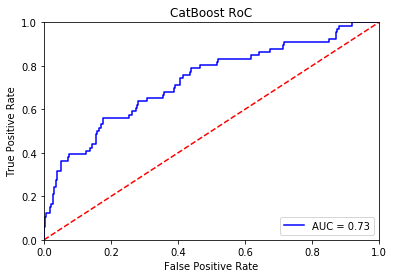

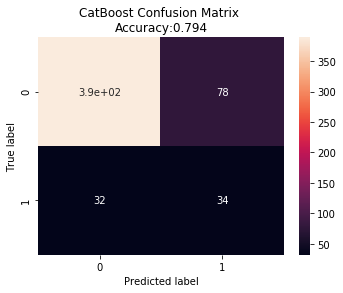

CatBoost  PR Curve: f1=0.382 auc=0.378


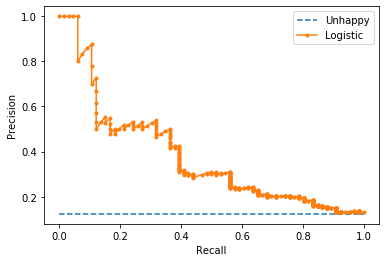

Accuracy: 	 0.7936210131332082
Recall: 	 0.5151515151515151
Precision: 	 0.30357142857142855
Specificity: 	 0.8329764453961456
NPV: 	 0.9239904988123515
F1: 		 0.38202247191011235


In [0]:
eval(y_oh_test, cat4_prob, cat4_pred, 'CatBoost')

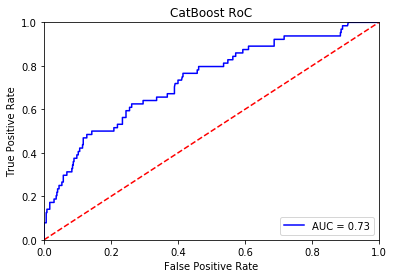

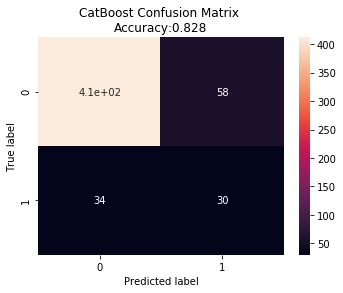

CatBoost  PR Curve: f1=0.395 auc=0.356


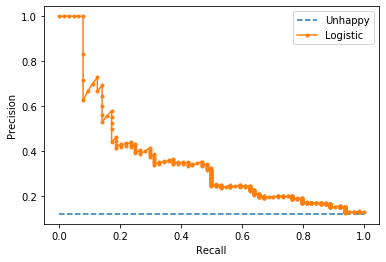

Accuracy: 	 0.8277153558052435
Recall: 	 0.46875
Precision: 	 0.3409090909090909
Specificity: 	 0.8765957446808511
NPV: 	 0.9237668161434978
F1: 		 0.39473684210526316


In [0]:
eval(y_ohcat_test, cat5_prob, cat5_pred, 'CatBoost')

In [0]:
cat4_feature_score = catboost_feature_importance(cat4, X_cat_test.columns.values)
cat4_feature_score.head(10)

,feature_name,score
79,SDNN_30m,33.930985
61,hr_median_3h,17.177786
76,hr_rest_rate_1h,9.477839
77,hr_moderate_rate_1h,9.179152
82,low_hr_30m,3.220862
63,hr_moderate_rate_3h,2.980380
67,rMSSD_1h,2.860064
69,high_hr_1h,1.846297
68,low_hr_1h,1.791835
66,pHR2_1h,1.436693


In [0]:
cat5_feature_score = catboost_feature_importance(cat5, X_ohcat_test.columns.values)
cat5_feature_score.head(10)

,feature_name,score
161,is_single,27.770822
159,is_married,15.130294
140,LAP_actual,9.919721
138,HAP_actual,5.210232
164,is_wht,4.533613
134,BIS.5,3.042013
144,HAN_actual,2.983737
139,P_actual,2.660296
146,HAP_ideal,2.552662
142,LAN_actual,2.424928


In [0]:
X_cat_test.columns.values

array(['step_max', 'step_min', 'step_median', 'steps_max_3h',
       'steps_min_3h', 'steps_mean_3h', 'steps_var_3h', 'steps_median_3h',
       'move_rate_3h', 'active_rate_3h', 'very_active_rate_3h',
       'running_rate_3h', 'steps_max_1h', 'steps_min_1h', 'steps_mean_1h',
       'steps_var_1h', 'steps_median_1h', 'move_rate_1h',
       'active_rate_1h', 'very_active_rate_1h', 'running_rate_1h',
       'steps_max_30m', 'steps_min_30m', 'steps_mean_30m',
       'steps_var_30m', 'steps_median_30m', 'move_rate_30m',
       'active_rate_30m', 'very_active_rate_30m', 'running_rate_30m',
       'steps_max_10m', 'steps_min_10m', 'steps_mean_10m',
       'steps_var_10m', 'steps_median_10m', 'move_rate_10m',
       'active_rate_10m', 'very_active_rate_10m', 'running_rate_10m',
       'steps_max_5m', 'steps_min_5m', 'steps_mean_5m', 'steps_var_5m',
       'steps_median_5m', 'move_rate_5m', 'active_rate_5m',
       'very_active_rate_5m', 'running_rate_5m', 'hr_max', 'hr_min',
       'hr_med', '

### (5) Cross Validation

i. Cross Validation for Logistic, Random Forest and CatBoost

In [0]:
lg_smote_result = []
rf_smote_result = []
cat_smote_result = []

skf = StratifiedKFold(n_splits=4, random_state=27, shuffle=False)
for train_index, test_index in skf.split(X_oh, group_oh):
  # Stratified Split
  X_oh_train, X_oh_test = X_oh.iloc[train_index], X_oh.iloc[test_index]
  y_oh_train, y_oh_test = y_oh.iloc[train_index], y_oh.iloc[test_index]
  # SMOTE
  sm = SMOTE(random_state=27, ratio=1.0)
  X_oh_smo_train, y_oh_smo_train = sm.fit_sample(X_oh_train, y_oh_train)

  scaler = preprocessing.StandardScaler().fit(X_oh_smo_train)
  X_oh_smo_train_scaled = scaler.transform(X_oh_smo_train)
  X_oh_test_scaled = scaler.transform(X_oh_test)
  # Logistic
  lg = LogisticRegression(max_iter=20000)
  lg.fit(X_oh_smo_train_scaled, y_oh_smo_train)
  lg_pred = lg.predict(X_oh_test_scaled)
  lg_res = eval_class(y_oh_test, lg_pred)
  lg_smote_result.append(lg_res)
  # Random Forest
  rf = RandomForestClassifier(n_estimators=100).fit(X_oh_smo_train_scaled, y_oh_smo_train)
  rf_pred = rf.predict(X_oh_test)
  rf_res = eval_class(y_oh_test, rf_pred)
  rf_smote_result.append(rf_res)
  # CatBoost
  cat = catboost.CatBoostClassifier(**params_2)
  cat.fit(X_oh_smo_train, y_oh_smo_train,
             eval_set = (X_oh_test, y_oh_test),
             use_best_model = True,
             plot=True)
  cat_pred = cat.predict(X_oh_test)
  cat_res = eval_class(y_oh_test, cat_pred)
  cat_smote_result.append(cat_res)

/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
/usr/local/lib/python3.6/dist-packages/sklearn/model_selection/_split.py:667: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=4.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Accuracy: 	 0.6704119850187266
Recall: 	 0.7115384615384616
Precision: 	 0.18686868686868688
Specificity: 	 0.6659751037344398
NPV: 	 0.9553571428571429
F1: 		 0.29600000000000004
Accuracy: 	 0.09737827715355805
Recall: 	 1.0
Precision: 	 0.09737827715355805
Specificity: 	 0.0
NPV: 	 nan
F1: 		 0.17747440273037543


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in long_scalars


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8158080	test: 0.7958801	best: 0.7958801 (0)	total: 87.8ms	remaining: 1m 27s
10:	learn: 0.8472124	test: 0.8239700	best: 0.8370787 (4)	total: 630ms	remaining: 56.6s
20:	learn: 0.8634439	test: 0.8239700	best: 0.8370787 (4)	total: 1.06s	remaining: 49.4s
30:	learn: 0.8680311	test: 0.8258427	best: 0.8370787 (4)	total: 1.51s	remaining: 47.4s
40:	learn: 0.8729711	test: 0.8220974	best: 0.8370787 (4)	total: 1.94s	remaining: 45.5s
50:	learn: 0.8754411	test: 0.8239700	best: 0.8370787 (4)	total: 2.4s	remaining: 44.7s
60:	learn: 0.8754411	test: 0.8277154	best: 0.8370787 (4)	total: 2.83s	remaining: 43.6s
70:	learn: 0.8743825	test: 0.8258427	best: 0.8370787 (4)	total: 3.27s	remaining: 42.8s
80:	learn: 0.8729711	test: 0.8220974	best: 0.8370787 (4)	total: 3.71s	remaining: 42s
90:	learn: 0.8722653	test: 0.8202247	best: 0.8370787 (4)	total: 4.15s	remaining: 41.4s
100:	learn: 0.8712068	test: 0.8220974	best: 0.8370787 (4)	total: 4.58s	remaining: 40.7s
Stopped by overfitting detector  (100 iterat

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Accuracy: 	 0.7166979362101313
Recall: 	 0.5925925925925926
Precision: 	 0.19875776397515527
Specificity: 	 0.7306889352818372
NPV: 	 0.9408602150537635
F1: 		 0.29767441860465116
Accuracy: 	 0.10131332082551595
Recall: 	 1.0
Precision: 	 0.10131332082551595
Specificity: 	 0.0
NPV: 	 nan
F1: 		 0.1839863713798978


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in long_scalars


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7651408	test: 0.7654784	best: 0.7654784 (0)	total: 105ms	remaining: 1m 44s
10:	learn: 0.8595070	test: 0.8067542	best: 0.8255159 (6)	total: 593ms	remaining: 53.3s
20:	learn: 0.8630282	test: 0.7936210	best: 0.8255159 (6)	total: 1.02s	remaining: 47.5s
30:	learn: 0.8721831	test: 0.8292683	best: 0.8292683 (29)	total: 1.46s	remaining: 45.5s
40:	learn: 0.8778169	test: 0.8405253	best: 0.8480300 (38)	total: 1.89s	remaining: 44.3s
50:	learn: 0.8742958	test: 0.8442777	best: 0.8480300 (38)	total: 2.33s	remaining: 43.4s
60:	learn: 0.8700704	test: 0.8386492	best: 0.8480300 (38)	total: 2.75s	remaining: 42.4s
70:	learn: 0.8700704	test: 0.8330206	best: 0.8480300 (38)	total: 3.19s	remaining: 41.8s
80:	learn: 0.8735915	test: 0.8292683	best: 0.8480300 (38)	total: 3.63s	remaining: 41.2s
90:	learn: 0.8746479	test: 0.8217636	best: 0.8480300 (38)	total: 4.07s	remaining: 40.6s
100:	learn: 0.8725352	test: 0.8255159	best: 0.8480300 (38)	total: 4.5s	remaining: 40.1s
110:	learn: 0.8771127	test: 0.82926

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Accuracy: 	 0.6735459662288931
Recall: 	 0.5967741935483871
Precision: 	 0.1989247311827957
Specificity: 	 0.6836518046709129
NPV: 	 0.9279538904899135
F1: 		 0.29838709677419356
Accuracy: 	 0.28893058161350843
Recall: 	 0.8870967741935484
Precision: 	 0.1288056206088993
Specificity: 	 0.21019108280254778
NPV: 	 0.9339622641509434
F1: 		 0.22494887525562374


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7734594	test: 0.7898687	best: 0.7898687 (0)	total: 70ms	remaining: 1m 9s
10:	learn: 0.8564426	test: 0.7748593	best: 0.8330206 (1)	total: 620ms	remaining: 55.8s
20:	learn: 0.8504902	test: 0.7767355	best: 0.8330206 (1)	total: 1.06s	remaining: 49.5s
30:	learn: 0.8553922	test: 0.7861163	best: 0.8330206 (1)	total: 1.5s	remaining: 46.8s
40:	learn: 0.8613445	test: 0.7879925	best: 0.8330206 (1)	total: 1.95s	remaining: 45.6s
50:	learn: 0.8630952	test: 0.7917448	best: 0.8330206 (1)	total: 2.4s	remaining: 44.7s
60:	learn: 0.8655462	test: 0.7917448	best: 0.8330206 (1)	total: 2.85s	remaining: 43.9s
70:	learn: 0.8732493	test: 0.7973734	best: 0.8330206 (1)	total: 3.31s	remaining: 43.3s
80:	learn: 0.8750000	test: 0.8067542	best: 0.8330206 (1)	total: 3.76s	remaining: 42.6s
90:	learn: 0.8735994	test: 0.8048780	best: 0.8330206 (1)	total: 4.21s	remaining: 42.1s
100:	learn: 0.8714986	test: 0.8030019	best: 0.8330206 (1)	total: 4.65s	remaining: 41.4s
Stopped by overfitting detector  (100 iteratio

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


Accuracy: 	 0.7166979362101313
Recall: 	 0.6666666666666666
Precision: 	 0.2543352601156069
Specificity: 	 0.7237687366167024
NPV: 	 0.9388888888888889
F1: 		 0.3682008368200837
Accuracy: 	 0.20075046904315197
Recall: 	 0.8787878787878788
Precision: 	 0.12184873949579832
Specificity: 	 0.10492505353319058
NPV: 	 0.8596491228070176
F1: 		 0.21402214022140223


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.7744413	test: 0.7166979	best: 0.7166979 (0)	total: 63.9ms	remaining: 1m 3s
10:	learn: 0.8365922	test: 0.7842402	best: 0.7898687 (9)	total: 608ms	remaining: 54.7s
20:	learn: 0.8442737	test: 0.7842402	best: 0.7898687 (9)	total: 1.06s	remaining: 49.6s
30:	learn: 0.8484637	test: 0.7842402	best: 0.7936210 (26)	total: 1.5s	remaining: 46.7s
40:	learn: 0.8446229	test: 0.7842402	best: 0.7936210 (26)	total: 1.93s	remaining: 45s
50:	learn: 0.8460196	test: 0.7861163	best: 0.7936210 (26)	total: 2.37s	remaining: 44.1s
60:	learn: 0.8495112	test: 0.7823640	best: 0.7936210 (26)	total: 2.82s	remaining: 43.4s
70:	learn: 0.8474162	test: 0.7823640	best: 0.7936210 (26)	total: 3.26s	remaining: 42.6s
80:	learn: 0.8484637	test: 0.7842402	best: 0.7936210 (26)	total: 3.69s	remaining: 41.9s
90:	learn: 0.8467179	test: 0.7823640	best: 0.7936210 (26)	total: 4.14s	remaining: 41.3s
100:	learn: 0.8453212	test: 0.7861163	best: 0.7936210 (26)	total: 4.58s	remaining: 40.7s
110:	learn: 0.8495112	test: 0.7898687

ii. Post processing

In [0]:
lg_avg_eval = np.mean(lg_smote_result, axis=0)
lg_avg_eval = np.append('Logistic', lg_avg_eval)

rf_avg_eval = np.mean(rf_smote_result, axis=0)
rf_avg_eval = np.append('Random Forest', rf_avg_eval)

cat_avg_eval = np.mean(cat_smote_result, axis=0)
cat_avg_eval = np.append('CatBoost', cat_avg_eval)

data = [lg_avg_eval, rf_avg_eval, cat_avg_eval]
cv_smote_res = pd.DataFrame(data=data, columns=['model', 'accuracy', 'recall', 'precision', 'specificity', 'npv', 'f1'])

iii. Result

In [0]:
cv_smote_res

,model,accuracy,recall,precision,specificity,npv,f1
0,Logistic,0.6943384559169705,0.6418929785865269,0.20972161053556118,0.7010211450759731,0.9407650343224272,0.3150655880497321
1,Random Forest,0.1720931621589336,0.9414711632453568,0.11233648952094291,0.0787790340839346,nan,0.2001079473968248
2,CatBoost,0.8279375803697535,0.42039710588097684,0.29514031862240486,0.8782095832283862,0.9248925636449383,0.3428395642786949


## 9.Conclusion

1. **CatBoost** in general performs the best, and **Over Sample Minority** + **CatBoost** gives best performance:

In [0]:
cv_upsample_res.iloc[2]

model                     CatBoost
accuracy         0.801218809508752
recall          0.6154634642537868
precision       0.3010899541071955
specificity     0.8241052421598551
npv              0.945556976270649
f1             0.40382214429108093
Name: 2, dtype: object

2. By tuning threshold, we can achieve 0.61 precision and 0.31 recall.